In [67]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
from sklearn.mixture import GaussianMixture as GMM
from scipy.stats import norm,multivariate_normal
import MarkedHawkesNNNHEst as MHN
from statsmodels.tsa.stattools import adfuller

# Simulation

In [68]:
MarkFunction="lognormal"
multpliedFunction="identity"
mean=2
variance=0.5

gamma=0.5
beta_0,beta_1=1,5.0
def markedDepenenceLambdaLN(mean,sd,value):
    p=0.5
    return p
def markedDepenenceLambda(beta,value):
    p=-(np.log(1-value))/beta
    return p
def markedDepenenceLambdaLN(mean,sd,value):
    p=np.random.lognormal(mean, sd, 1)[0]
    return p

def markedFactorMultplied(p,gamma):
    if multpliedFunction=="identity":
        return p
    elif multpliedFunction=="log":
        return gamma*np.log(p+ 1)

def markedFactorMultplied1(p,gamma):
    
    return p

def markedDepenenceLambda1(mu,sd,value):
    p=np.sqrt(-2*np.log(value*sd*np.sqrt(2*np.pi)))*sd+mu
    return p

def markFunction(A,alpha,mark):
    return A*np.exp(alpha*mark)

def function_kernel(k,theta,tau,c):
    kernel=k*(tau+c)**(-1-theta)
    return kernel

def function_kernel1(theta,tau):
    kernel=(np.exp(-theta*tau))
    return kernel

def function_kernel2(theta,tau):
    kernel=np.ones(len(tau))*0.01
    return kernel

def markToKernel(marks):
    gm = np.ones((len(marks)))
    #gm=gm*marks
    return gm




def simu_univariateMarked1(mu,theta,beta,T,mean=0,variance=0.5):    
    lambda_int=mu
    s=0
    tau=[]
    lambda_val=[]
    l2=[]  
    g_x=np.random.uniform(0.0,1.0,1)[0]
    marks=1
    if MarkFunction=="lognormal":
        threshold=markedDepenenceLambdaLN(mean,variance,0.5)
    else:
        threshold=markedDepenenceLambda(beta,0.5)
    lambda_s=mu
    while s<T:
        sum1=0
        new_tau = np.array(tau[::-1])
        l3=np.array(l2[::-1])
        sum1=(function_kernel1(theta,s-new_tau[0:])*(markedFactorMultplied(l3[0:],gamma))).sum()
        lambda_ = lambda_int + sum1+threshold

        u=np.random.uniform(0,1,1)[0]
        w=-np.log(u)/lambda_
        s=s+w
        d=np.random.uniform(0,1,1)[0]
        sum1=(function_kernel1(theta,s-new_tau[0:])*(markedFactorMultplied(l3[0:],gamma))).sum()
        
        lambda_s = lambda_int +  sum1
        
        if (d*lambda_<=lambda_s):
            t=s
            tau.append(t)
            g_x=np.random.uniform(0.0,1.0,1)[0]
            if MarkFunction=="lognormal":
                marks=markedDepenenceLambdaLN(mean,variance,g_x)
            else:
                marks=markedDepenenceLambda(beta,g_x)
            l2.append(marks)
        if (len(tau))>3000:
            break
    summary(l2,tau)
    return np.array(tau[:-1]),np.array(np.array(l2[:-1]))
def loglikelihood(para,t,marks):
    theta=para[0]
    beta =para[1]
    mu=para[2]
    tend = t[-1]-t
    ll=mu*(t[-1]-t[0])
    llIn=((1-np.exp(-theta*tend))/theta*marks).sum()
    ll+=llIn
    print('Integrated Value',llIn)
    for i in range(0,len(t),1):
        temp = t[i]-t[0:i]
        markTemp=marks[0:i]
        logLam = -np.log(mu+(markTemp*np.exp(-theta*temp)).sum())
        ll = ll+logLam
    print("log Part",ll-llIn)
    if MarkFunction=="lognormal":
        markFunctionSum=(np.log(np.exp((-(np.log(marks) - mean)**2) / (2 * variance))/ 
                         (marks * np.sqrt(2 * np.pi*variance)))).sum()
    else:
        
        markFunctionSum=(np.log(beta*np.exp(-beta*marks))).sum()    
    print("mark Function Sum",markFunctionSum)
    ll-=markFunctionSum
    return ll


def function_kernelCombined(marks,tau,beta_0,beta_1):
    return marks*np.exp(-tau*(beta_0+beta_1*marks))


def simu_univariateMarked2(mu,T,beta_0,beta_1,mean=0,variance=0.5):    
    lambda_int=mu
    s=0
    tau=[]
    lambda_val=[]
    l2=[]  
    g_x=np.random.uniform(0.0,1.0,1)[0]
    marks=1
    threshold=1
    lambda_s=mu
    while s<T:
        sum1=0
        new_tau = np.array(tau[::-1])
        l3=np.array(l2[::-1])
        sum1=(function_kernelCombined(l3[:],s-new_tau[:],beta_0,beta_1)).sum()
        lambda_ = lambda_int + sum1+threshold

        u=np.random.uniform(0,1,1)[0]
        w=-np.log(u)/lambda_
        s=s+w
        d=np.random.uniform(0,1,1)[0]
        sum1=(function_kernelCombined(l3[:],s-new_tau[:],beta_0,beta_1)).sum()
        
        lambda_s = lambda_int +  sum1
        
        if (d*lambda_<=lambda_s):
            t=s
            tau.append(t)
            g_x=np.random.uniform(0.0,1.0,1)[0]
            if MarkFunction=="lognormal":
                marks=markedDepenenceLambdaLN(mean,variance,g_x)
            else:
                marks=markedDepenenceLambda(beta,g_x)
            l2.append(marks)
        if (len(tau))>3000:
            break
    summary(l2,tau)
    return np.array(tau[:-1]),np.array(np.array(l2[:-1]))

def summary(l2,tau):
    print("################## Simualtion Summary ##################\n")
    print("Data plotted with Mark distribution as", MarkFunction)
    if MarkFunction=="lognormal":
        print(" With mean %.2f and variance %.8f" %(mean,variance))
    else:
        print("with hazard rate %.2f"%(beta))
    print("The kernel function for the time set is")
    print("exponential Distribution")
    print("The kernel function for the mark set is")
    if multpliedFunction=="identity":
        print("Identity fucntion")
    elif multpliedFunction=="log":
        print("log function with equation %.2flog(m+1)"%(gamma))
    print("mean of marks is ",np.mean(l2[:-1]))
    print("mean of interarival times is",np.mean(np.diff(tau)))
    print("#########################################################")
    return 0
               


In [69]:
def mark_distribution(marks):
    x =marks
    x = x.reshape(-1, 1)




    optimal_checks=20
    bestAIC=1e8
    for j in range(1,optimal_checks):
        gmm = GMM(n_components = j, max_iter=1000, random_state=10, covariance_type = 'full')
        g=gmm.fit(x)
        AIC=gmm.aic(x)
        if bestAIC>AIC:
            n_optimal=j
            bestAIC= AIC
# create GMM model object
    gmm = GMM(n_components = n_optimal, max_iter=1000, random_state=10, covariance_type = 'full')

# find useful parameters
    g=gmm.fit(x)
    mean = g.means_  
    covs  = g.covariances_
    weights = g.fit(x).weights_

# create necessary things to plot
    x_axis = np.sort(marks)
    y_axis0=0


    for j in range(n_optimal):
        y_axis0 += norm.pdf(x_axis, float(mean[j][0]), np.sqrt(float(covs[j][0][0])))*weights[j]# 1st gaussian

    fig = plt.figure(figsize=(10, 4))
    ax = fig.add_subplot(1,2,2)
# Plot 2
    plt.hist(x, density=True, bins=100, color='black')

    plt.plot(x_axis, y_axis0, lw=3, c='C2', ls='dashed')

#plt.ylim(0.0, 2.0)
    plt.xlabel(r"X", fontsize=20)
    plt.ylabel(r"Density", fontsize=20)

    plt.subplots_adjust(wspace=0.3)
    plt.show()
    plt.close('all')
    print(n_optimal)
    return -(np.log(y_axis0)).sum()


# Initialization

In [70]:


def inflectionPoints():
   
    div = B[0]+epsilon*(np.abs(B[0])<epsilon)
    x1 = -B[2]/div
    interestX1 = x1
    Dict['inflection1'] = interestX1
    
    x2 = -B[1]/div
    interestX2 = x2
    Dict['inflection2'] = interestX2
    
    con = A[0]*B[0]
    Dict['constant'] = con
    return

def initializeParams(nNeurons,nNeuronsM):
    alphas = -(np.random.uniform(0,1,nNeurons)).reshape(-1,1)*1
    alpha0 = -np.random.uniform(0,1,1)*0.1
    betas1 = (np.random.uniform(-1,1,nNeurons)).reshape(-1,1)*0.3
    betas2 = (np.random.uniform(-1,1,nNeurons)).reshape(-1,1)*0.2
    beta0 = np.random.uniform(0,1,nNeurons).reshape(-1,1)*0.03
    
    alphasM = (np.random.uniform(0,1,nNeuronsM)).reshape(-1,1)*0.2
    alpha0M = np.random.uniform(0,1,1)*0.01
    
    betas11M=(np.random.uniform(-0.5,0,int(nNeuronsM/2)))
    betas12M=(np.random.uniform(0,1,int(nNeuronsM/2)))
    betasM =(np.concatenate([betas12M,betas11M],axis=0)).reshape(-1,1)*2.5
    beta0M =(np.concatenate([betas12M,betas12M],axis=0)).reshape(-1,1)*1
    

    
    mu =len(t1)/t1[-1]*1
   
    
    A.append(alphas)
    B.append(betas1)
    B.append(betas2)
    A.append(alpha0)
    B.append(beta0)
    
    M.append(alphasM)
    M.append(alpha0M)
    M.append(betasM)
    M.append(beta0M)
    
    
    A_grad.append(np.zeros([nNeurons,1]))
    A_grad.append(0)
    B_grad.append(np.zeros([nNeurons,1]))
    B_grad.append(np.zeros([nNeurons,1]))
    B_grad.append(np.zeros([nNeurons,1]))
    
    gradM.append(np.zeros([nNeuronsM,1]))
    gradM.append(0)
    gradM.append(np.zeros([nNeuronsM,1]))
    gradM.append(np.zeros([nNeuronsM,1]))
    
    return mu

# Estimation

In [71]:
def nnIntegratedKernel(x,marks):
    x = x.reshape(-1)
    alphas = A[0]
    alpha0 = A[1]
    betas1 = B[0]
    betas2 =B[1]
    beta0 = B[2]
    const1 = Dict.get('constant')
    interestX1 = Dict.get('inflection1')
    interestX2 = Dict.get('inflection2')
   
    y = np.zeros([1,len(x)])
    for i in range(0,len(x)):
        mark=marks[i]
        xi = x[i]      
        if(xi>0):
            iP1=interestX1+interestX2*mark
            iP1=iP1[iP1>0]
            iP1=np.sort(iP1)
            iP1=np.append(0,iP1)
            iPs = iP1[iP1<xi]
            prev_term=precalculate_integrate(iPs,mark)
            
            iP=iPs[-1]
            n1 = betas1*(xi-epsilon) + betas2*mark + beta0
            dn1 = (n1>0)
            const =np.dot(const1.T,dn1)
            
            
            term1 = nnKernel(xi,mark)*((const!=0)+xi*(const==0))
            term2 = nnKernel(iP,mark)*((const!=0)+iP*(const==0))
            
            const = (const)*(const!=0)+(const==0)*1.0 
            
            y[0,i] = prev_term + ((term1-term2)/(const))
    return y

def nnKernel(x,mark):
    alphas = A[0]
    alpha0 = A[1]
    betas1 = B[0]
    betas2 = B[1]
    beta0 = B[2]
    x=x.reshape(1,-1)
    markI=mark.reshape(1,-1)
    n1 = np.maximum(np.dot(betas1,x) + np.dot(betas2,markI)+ beta0,0.)
    y = np.dot(alphas.T,n1) + alpha0
    y = np.exp(y)
    return y    

def nnKernelMatrix(x,y):
    z=np.zeros((len(x),len(y)))
    for i in range(len(x)):
        z[i,:]=nnKernel(x[i,:],y[i,:]).reshape(-1)
            
    return z


def precalculate_integrate(iPs,mark):
    alphas = A[0]
    alpha0 = A[1]
    betas1 = B[0]
    betas2 = B[1]
    beta0 = B[2]
    
    const1 = Dict.get('constant')
    y = 0
    for index in range(1,len(iPs)):
        n1 = betas1*(iPs[index]-epsilon)+betas2*mark + beta0
        dn1 = (n1>0)
        const =np.dot(const1.T,dn1)
            
            
        term1 = nnKernel(iPs[index],mark)*((const!=0)+iPs[index]*(const==0))
        term2 = nnKernel(iPs[index-1],mark)*((const!=0)+iPs[index-1]*(const==0))
            
        const = (const)*(const!=0)+(const==0)*1.0
              
        y= y + ((term1-term2)/(const))
    return y
    
    
def precalculate_gradient(iP,mark):
    alphas = A[0]
    alpha0 = A[1]
    betas1 = B[0]
    betas2 = B[1]
    beta0 = B[2]

    gradA = alphas*0
    gradB1 = gradA*0
    gradB0 = gradB1*0
    gradB2 = gradB1*0
    
    gradA0=0
    

    const1 = Dict.get('constant')
    if len(iP)==1:
        return list([gradA0,gradA,gradB1,gradB2,gradB0])
    for index in range(1,len(iP)):
        n0pr = betas1*(iP[index-1]+epsilon)+betas2*mark+beta0
        n1pr = betas1*(iP[index]-epsilon)+betas2*mark+ beta0
        dn1 = (n1pr>0)
        dn0 = (n0pr>0)
        const =np.dot(const1.T,dn1)
        indicator = const==0
        const = const*(const!=0)+1*(const==0)
        n0 = betas1*(iP[index-1])+betas2*mark+beta0
        n1 = betas1*(iP[index]) + betas2*mark+beta0
        
        fac1 = nnKernel(iP[index],mark)
        fac2 = nnKernel(iP[index-1],mark)
        gradA0 = gradA0 + ((1/const)*(fac1-fac2))*(~indicator)+(fac1)*(indicator)*(iP[index]-iP[index-1])
        gradA = gradA -((1/(const*const))*(betas1*dn1)*(fac1-fac2))*(~indicator)
        gradA = gradA + ((1/const)*(fac1*np.maximum(n1,0)-fac2*np.maximum(n0,0)))*(~indicator)
        gradB1 = gradB1 -((1/(const*const))*(alphas*dn1)*(fac1-fac2))*(~indicator)
        gradB1 = gradB1 + ((1/const)*(alphas)*(fac1*iP[index]*dn1-fac2*iP[index-1]*dn0))*(~indicator)
        gradB2 = gradB2 +((1/const)*mark*alphas*(fac1*dn1-fac2*dn0))*(~indicator)
        gradB0 = gradB0+ ((1/const)*((alphas)*(fac1*dn1-fac2*dn0)))*(~indicator)
        
        Dict_gradient= list([gradA0,gradA,gradB1,gradB2,gradB0])
    
    return Dict_gradient
        
            
         
    
def gradientNetwork(iArray,mu,t,marks):
    alphas = A[0]
    alpha0 = A[1]
    betas1 = B[0]
    betas2 = B[1]
    beta0 = B[2]
    
    alphasM = M[0]
    alpha0M = M[1]
    betasM = M[2]
    beta0M  = M[3]

    tend = t[-1]-t
    const1 = Dict.get('constant')
    gradA = alphas*0
    gradB1 = gradA*0
    gradB0 = gradB1*0
    gradB2 = gradB0*0
    gradA0=0
    grad_mu = 0
    
    gradAM = alphasM*0
    gradBM = gradAM*0
    gradB0M = gradBM*0
    gradA0M=0
    interestX1 = Dict.get('inflection1')
    interestX2 = Dict.get('inflection2')
    temp = 0
    for i in np.nditer(iArray):
        xi=tend[i]
        mark=marks[i]
        if(xi>0):
            iP1=interestX1+interestX2*mark
            iP1=iP1[iP1>0]
            iP1=np.sort(iP1)
            iP1=np.append(0,iP1)
            iPs = iP1[iP1<xi]
            gradients = precalculate_gradient(iPs,mark)
            iP = iPs[-1]
            n1pr = betas1*(xi-epsilon)+betas2*mark + beta0
            n0pr = betas1*(iP+epsilon) +betas2*mark +beta0
           
            dn1 = (n1pr>0)
            dn0 = (n0pr>0)
            const =np.dot(const1.T,dn1)
            indicator = const==0
            const = const*(const!=0)+1*(const==0)
            n0 = betas1*(iP)+ betas2*mark + beta0
            n1 = betas1*(xi) + betas2*mark+ beta0
            fac1 = nnKernel(xi,mark)
            fac2 = nnKernel(iP,mark)
            
            
            
            gradA0 = gradA0+gradients[0] + ((1/const)*(fac1-fac2))*(~indicator)+(fac1)*(indicator)*(xi-iP)
            
            gradA = gradA + gradients[1] -((1/(const*const))*(betas1*dn1)*(fac1-fac2))*(~indicator)
            gradA = gradA + ((1/const)*(fac1*np.maximum(n1,0)-fac2*np.maximum(n0,0)))*(~indicator)
            
            gradB1 = gradB1+gradients[2] -((1/(const*const))*(alphas*dn1)*(fac1-fac2))*(~indicator)
            gradB1 = gradB1+ ((1/const)*(alphas)*(fac1*xi*dn1-fac2*iP*dn0))*(~indicator)
            gradB2 = gradB2 + gradients[3] +((1/const)*mark*alphas*(fac1*dn1-fac2*dn0))*(~indicator)
            
            gradB0 =gradB0+ gradients[4] + ((1/const)*((alphas)*(fac1*dn1-fac2*dn0)))*(~indicator)
        
         
    for i in np.nditer(iArray):
        li = max(i-support,0)
        temp = t[i]-t[0:i]
        mark=marks[0:i]
        fac1 = nnKernel(temp.reshape(1,-1),mark)
        decayFactor = np.sum(fac1)
        lam = mu+decayFactor
        invLam = (1/lam)
        n1 = np.dot(betas1,temp.reshape(1,-1)) + np.dot(betas2,mark.reshape(1,-1))  + beta0
        
        
        gradA = gradA-np.sum(invLam*(fac1*np.maximum(n1,0)),axis=1).reshape(-1,1)
        
        gradA0 = gradA0 - invLam*decayFactor
        
        gradB1 = gradB1 - invLam*np.sum(fac1*(n1>0)*alphas*temp.reshape(1,-1),axis=1).reshape(-1,1)
        gradB2 = gradB2 - invLam*np.sum(fac1*(n1>0)*alphas*mark.reshape(1,-1),axis=1).reshape(-1,1)
        gradB0 = gradB0 - invLam*np.sum(fac1*(n1>0)*alphas,axis=1).reshape(-1,1)
      
        grad_mu = grad_mu + ((t[i]-t[i-1])-invLam)*(i >0)*(t[i]>0)
    
    gradA = gradA/len(iArray)
    gradB1 = gradB1/len(iArray)
    gradB2 = gradB2/len(iArray) 
    gradB0 = gradB0/len(iArray)
    gradA0 = gradA0/len(iArray)
    
            
    gradAM = gradAM/len(iArray)
    gradBM = gradBM/len(iArray)
    gradB0M = gradB0M/len(iArray)
    gradA0M = gradA0M/len(iArray)
    
    A_grad[0] = gradA
    A_grad[1] = gradA0
    B_grad[0] = gradB1
    B_grad[1] = gradB2
    B_grad[2] = gradB0
    
    gradM[0] = gradAM
    gradM[1] = gradA0M
    gradM[2] = gradBM
    gradM[3] = gradB0M
    #print(gradM)
    return (grad_mu/len(iArray))





def plotKernels():
    dx=0.1
    
    marksplot=np.sort(marks1)
    lengthMarks=len(marksplot)
    marksMin=marksplot[int(0.05*lengthMarks)]
    marksMax=marksplot[int(0.95*lengthMarks)]
    diff_t=np.diff(tscale)
    diff_tSort=np.sort(diff_t)
    length_difftSort=len(diff_tSort)
    diffMin= diff_tSort[int(0.05*length_difftSort)]
    diffMax= diff_tSort[int(0.95*length_difftSort)]
    tk =np.arange(diffMin,diffMax,dx)
    marksP=np.linspace(marksMin,marksMax,len(tk))
    
    
    X, Y = np.meshgrid(tk, marksP)
    if kernelMarks=="combined":
        Z=function_kernelCombined(Y/facM,X,beta_0,beta_1)
  
    else:
        if(kernelType == 0):
            #y = alpha*np.exp(-beta*tk)
            Z=markedFactorMultplied(Y/facM,gamma)*function_kernel1(theta,X)
        
    Z2=nnKernelMatrix(X/fac,Y)*fac   
    
    fig = plt.figure(figsize=(6,4))
 
  
    ax = plt.axes(projection ='3d')
    
        

    surf=ax.plot_wireframe(X/fac, Y/facM, Z, cmap="Blues",
                       rstride=2, cstride=2, alpha=0.8,color="blue",label="real")
    surf1 = ax.plot_wireframe(X/fac, Y/facM, Z2, cmap="Reds",
                       rstride=2, cstride=2, alpha=0.8,color="red",label="Method")
    fig.colorbar(surf, label='Real Value')
    fig.colorbar(surf1, label='New Method')
    ax.set_xlabel('time')
    ax.set_ylabel('Marks')
    ax.set_zlabel('$\phi$')
    plt.grid()
    plt.pause(0.0005)
    tk = np.arange(0,5,dx)
    
    marks2=np.arange(marksMin,marksMax,dx)

    dp=1
    fig = plt.figure(figsize=(6,4))
    X1=np.linspace(marksMin,marksMax,4)
    R=np.linspace(0.0,1,len(X1))
    G=np.linspace(0,0.5,len(X1))
    B1=np.linspace(0,0.5,len(X1))
    for j in range(len(X1)):
        if kernelMarks=="combined":
            plt.plot(tk/fac,function_kernelCombined(X1[j]/facM,tk,beta_0,beta_1),"--",color=(R[j],G[j],B1[j]))
        else:
            plt.plot(tk/fac,markedFactorMultplied(X1[j]/facM,gamma)*function_kernel1(theta,tk),"--",color=(R[j],G[j],B1[j]))
        plt.plot(tk/fac,nnKernel(tk/fac,np.ones(len(tk))*X1[j]).reshape(-1)*fac,label='Marks=%.2f'%X1[j],color=(R[j],G[j],B1[j]))
        #plt.plot(tk/fac,markedFactorMultplied(X1[j]/facM,gamma)*function_kernel1(theta,tk),"--",color=(R[j],G[j],B1[j]))
        plt.xlabel('t')
        plt.ylabel('$\phi$')


    plt.legend()

    plt.pause(0.005)
  
    fig = plt.figure(figsize=(6,4))
    X2=np.linspace(diffMin,diffMax,len(X1))
    for j in range(len(X2)):
        if kernelMarks!="combined":
            plt.plot(marksP/facM,markedFactorMultplied(marksP/facM,gamma)*function_kernel1(theta,X2[j]),"--",color=(R[j],G[j],B1[j]))
        else:
            plt.plot(marksP/facM,function_kernelCombined(marksP/facM,X2[j],beta_0,beta_1),"--",color=(R[j],G[j],B1[j]))
   
        #plt.plot(marksP,markedFactorMultplied(marksP/facM,gamma)*function_kernel1(theta,X2[j]),"--",color=(R[j],G[j],B1[j]))
        plt.plot(marksP/facM,nnKernel(np.ones(len(marksP))*X2[j],marksP).reshape(-1)*fac,label='t=%.2f'%X2[j],color=(R[j],G[j],B1[j]))
        
        plt.xlabel('Marks')
        plt.ylabel('$\phi$')

    plt.legend()
    plt.pause(0.005)
               
                           
    return 0
    

def nnLoglikelihood(mu,t,marks):
    
    tend = (t[-1]-t)
    a = np.sum(nnIntegratedKernel(tend,marks))
    print("Integrated",a)
   
    ll = mu*t[-1]+a
    ll = ll-np.log(mu)
    llInit = ll+np.log(mu)
    
    nElements = max(t.shape)
    
    
    for i in range(1,nElements,1):
        li = max(i-support,0)
        li=0
        temp = t[i]-t[0:i]
        mark=marks[0:i]
        z = np.sum(nnKernel(temp,mark))
        
        
        logLam = -np.log(max(1e-10,mu+z))
        
        ll = ll+logLam
    markFuSum=markFunctionLL

    ll+=markFuSum
    return ll


def nnLoglikelihoodTest(mu,t1,marks1,t,marks,len_train):
    tend = t1[-1]-t1[:]
    a = np.sum(nnIntegratedKernel(tend,marks1[:]))
   
    ll = mu*(t1[-1]-t1[0])+a
    
    nElements = len(t1)
    
    ll=ll-np.log(mu)
    for i in range(1,nElements,1):
        new_len=i+len_train
        li = max(new_len-support,0)
        temp = t1[i]-t[li:new_len]
        mark=marks[li:new_len]
        z = np.sum(nnKernel(temp,mark))
        
        
        logLam = -np.log(mu+z)
        
        ll = ll+logLam
    markFuSum=markFunctionLL
    ll+=markFuSum
    return ll

def summaryData(marks,t,check_range=10):
    print("################## Dataset Summary ##################\n")
    
    print("mean of marks foris",np.mean(marks))
    TS=[]
    final=0
    while final<t[-1]:
        initial=final
        final+=check_range
        TS.append((marks[(t>initial)*(t<final)]).sum())
    result_mark=adfuller(TS)
    if result_mark[1]<0.1:
        print("Marks are stationary")
    else:
        print("Marks are non stationary")
    print("------------------------------------------------------------------------")
    print("mean of interarival times is",np.mean(np.diff(t)))
    print("Number of Data points Generated",len(t))
    print("#########################################################")
    return 0
 
def sgdNeuralHawkes(nEpochs,lr,mu,t,marks):
    summaryData(marks,t)
    global optimalParams
    lr2 =lr*0.1
    lr_mu = lr*0.1
    beta_1 = 0.9
    beta_2 =0.999
    bestll = bestll1= 1e8
    neg_ll = []
    t_train=t[0:int(0.7*len(t))]
    marks_train=marks[0:int(0.7*len(t))]
    t_val=t[int(0.7*len(t)):int(0.85*len(t))]
    marks_val=marks[int(0.7*len(t)):int(0.85*len(t))]
    t_test=t[int(0.85*len(t)):]
    marks_test=marks[int(0.85*len(t)):]


    m_t_A = np.zeros([nNeurons,1])
    m_t_A0 =0
    m_t_B1= np.zeros([nNeurons,1])
    m_t_B2= np.zeros([nNeurons,1])
    m_t_B0= np.zeros([nNeurons,1])
    m_t = 0
    v_t_A = np.zeros([nNeurons,1])
    v_t_A0 =0
    v_t_B1= np.zeros([nNeurons,1])
    v_t_B2= np.zeros([nNeurons,1])
    v_t_B0= np.zeros([nNeurons,1])
    v_t = 0
    
    
    plotKernels()
    count = 0
    stopping_count=0
    inflectionPoints()
    print("intial LL",nnLoglikelihood(mu,t,marks))
    for epochs in range(1,nEpochs+1,1):
        
        
        rsample = np.random.choice(len(t_train),len(t_train)-1,replace = False)
        for i in range(1,len(rsample),100):
            count=count+1 
            #print("before",M[2])
            grad = gradientNetwork(rsample[i:i+100],mu,t_train,marks_train)
            
            m_t = beta_1*m_t + (1-beta_1)*grad	#updates the moving averages of the gradient
            v_t = beta_2*v_t + (1-beta_2)*(grad*grad)	#updates the moving averages of the squared gradient
            m_cap = m_t/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap = v_t/(1-(beta_2**count))		#calculates the bias-corrected estimates
            mu = mu-(lr_mu*m_cap)/(np.sqrt(v_cap)+epsilon)
            mu = np.maximum(mu,0)
        
            
            m_t_A = beta_1*m_t_A + (1-beta_1)*A_grad[0]	#updates the moving averages of the gradient
            v_t_A = beta_2*v_t_A + (1-beta_2)*(A_grad[0]*A_grad[0])	#updates the moving averages of the squared gradient
            m_cap_A = m_t_A/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap_A = v_t_A/(1-(beta_2**count))		#calculates the bias-corrected estimates
            A[0] = A[0]-(lr*m_cap_A)/(np.sqrt(v_cap_A)+epsilon)
            
            
            m_t_A0 = beta_1*m_t_A0 + (1-beta_1)*A_grad[1]	#updates the moving averages of the gradient
            v_t_A0 = beta_2*v_t_A0 + (1-beta_2)*(A_grad[1]*A_grad[1])	#updates the moving averages of the squared gradient
            m_cap_A0 = m_t_A0/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap_A0 = v_t_A0/(1-(beta_2**count))		#calculates the bias-corrected estimates
            A[1] = A[1]-(lr*m_cap_A0)/(np.sqrt(v_cap_A0)+epsilon)
            
                
            m_t_B1 = beta_1*m_t_B1 + (1-beta_1)*B_grad[0]	#updates the moving averages of the gradient
            v_t_B1 = beta_2*v_t_B1 + (1-beta_2)*(B_grad[0]*B_grad[0])	#updates the moving averages of the squared gradient
            m_cap_B1 = m_t_B1/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap_B1= v_t_B1/(1-(beta_2**count))		#calculates the bias-corrected estimates
            B[0] = B[0]-(lr2*m_cap_B1)/(np.sqrt(v_cap_B1)+epsilon)
            
            m_t_B2 = beta_1*m_t_B2 + (1-beta_1)*B_grad[1]	#updates the moving averages of the gradient
            v_t_B2 = beta_2*v_t_B2 + (1-beta_2)*(B_grad[1]*B_grad[1])	#updates the moving averages of the squared gradient
            m_cap_B2 = m_t_B2/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap_B2= v_t_B2/(1-(beta_2**count))		#calculates the bias-corrected estimates
            B[1] = B[1]-(lr2*m_cap_B2)/(np.sqrt(v_cap_B2)+epsilon)
            
            
            m_t_B0 = beta_1*m_t_B0 + (1-beta_1)*B_grad[2]	#updates the moving averages of the gradient
            v_t_B0 = beta_2*v_t_B0 + (1-beta_2)*(B_grad[2]*B_grad[2])	#updates the moving averages of the squared gradient
            m_cap_B0 = m_t_B0/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap_B0 = v_t_B0/(1-(beta_2**count))		#calculates the bias-corrected estimates
            B[2] = B[2]-(lr2*m_cap_B0)/(np.sqrt(v_cap_B0)+epsilon)
            
          
            inflectionPoints()
            if epochs>1 and count>=10:
                error1=nnLoglikelihoodTest(mu,t_val,marks_val,t,marks,len(t_train))
                #error1=nnLoglikelihood(mu,t_train,marks_train)
                if(bestll1 > error1):
                    optimalParams = list([A[0],A[1],B[0],B[1],B[2],mu*fac])
                    stopping_count=0
                    bestll1=error1
                    print("change")
                else:
                    stopping_count+=1
                count=0
                neg_ll.append(error1)
 
        if stopping_count>=10:
            return optimalParams, neg_ll, nEpochs
        if epochs>2:
            print(i,epochs,bestll1,error1,mu*fac)
        plotKernels()
        
    return optimalParams, neg_ll, nEpochs



################## Simualtion Summary ##################

Data plotted with Mark distribution as lognormal
 With mean 2.00 and variance 0.50000000
The kernel function for the time set is
exponential Distribution
The kernel function for the mark set is
Identity fucntion
mean of marks is  8.356090841246237
mean of interarival times is 1.103098628569702
#########################################################
Integrated Value 2161.113585427369
log Part 524.6896876811625
mark Function Sum -5115.807881232529
original Likelihood 7801.611154341061


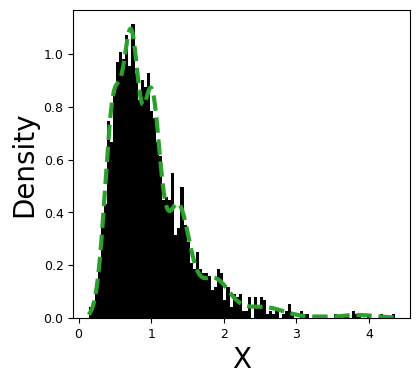

7
################## Dataset Summary ##################

mean of marks foris 1.0000000000000002
Marks are stationary
------------------------------------------------------------------------
mean of interarival times is 1.0000138701296775
Number of Data points Generated 1812
#########################################################


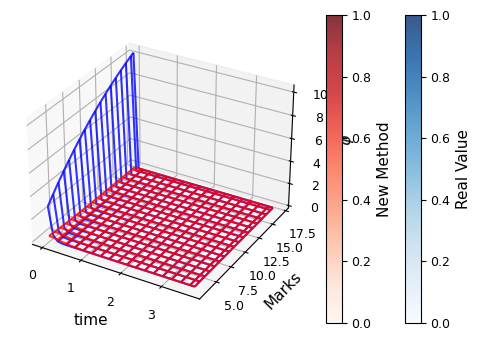

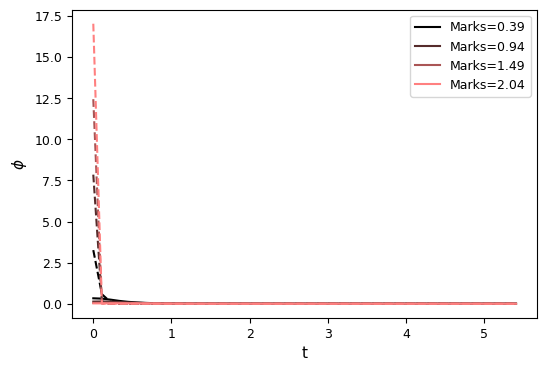

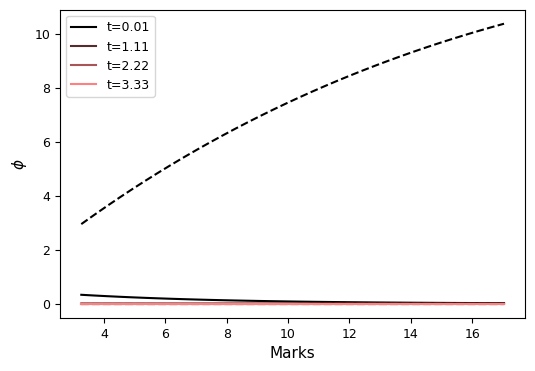

Integrated 165.1233010017271
intial LL 2871.136610323404


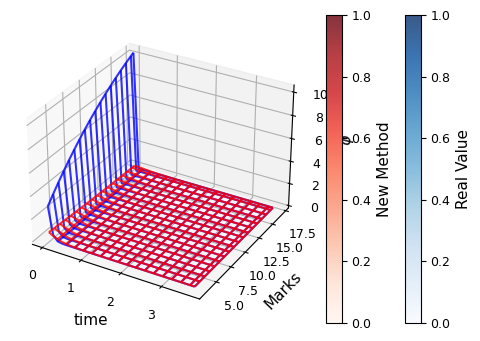

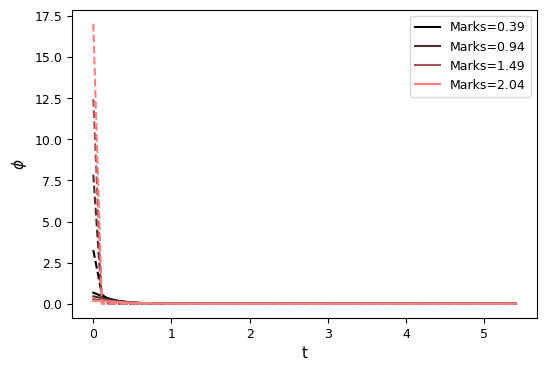

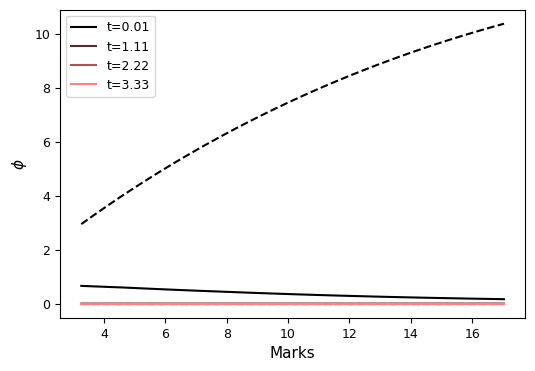

change
change


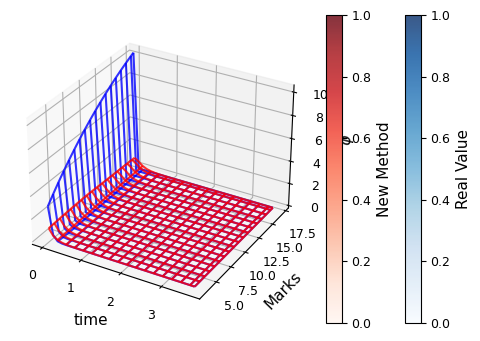

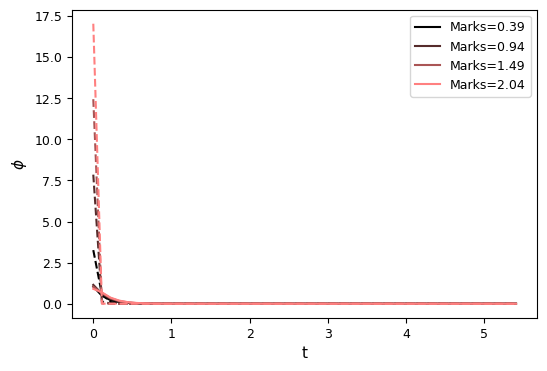

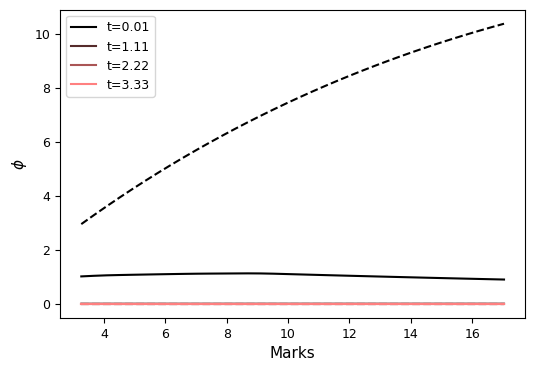

change
1201 3 1374.876950314255 1374.876950314255 0.7789066035649589


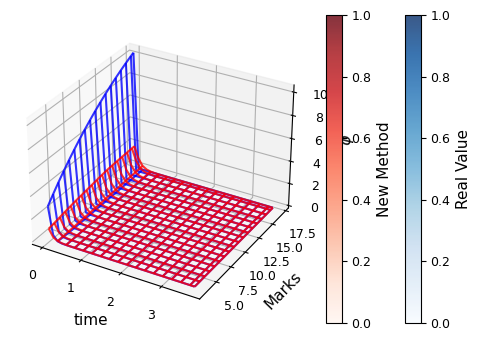

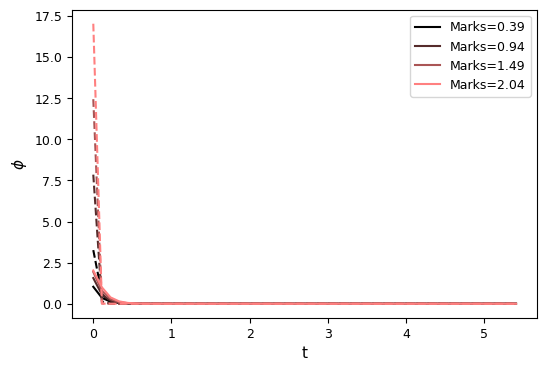

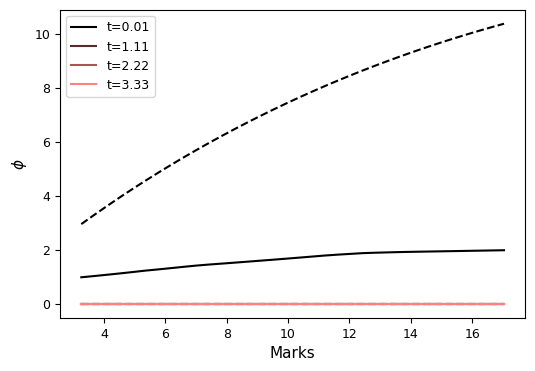

change
1201 4 1374.0151131749822 1374.0151131749822 0.7671950712914615


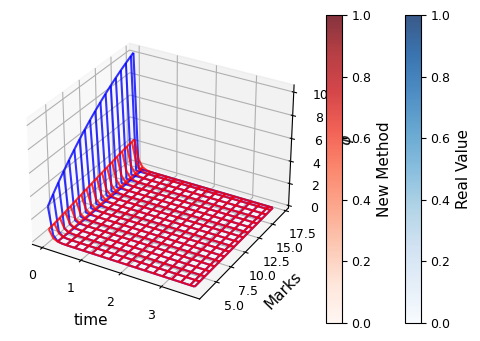

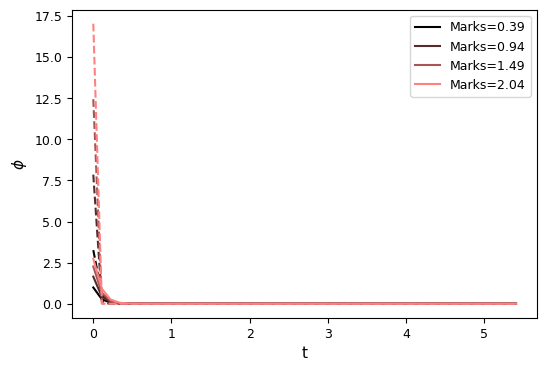

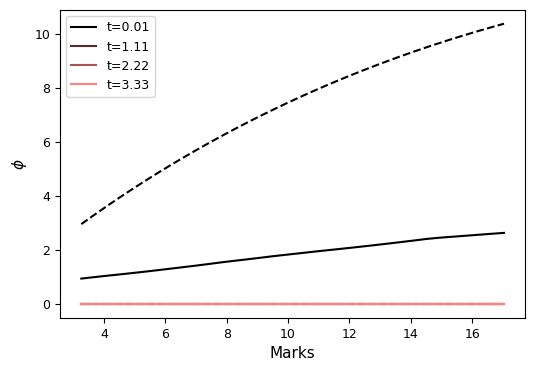

change
change
1201 5 1368.1894272911538 1368.1894272911538 0.7585507010561802


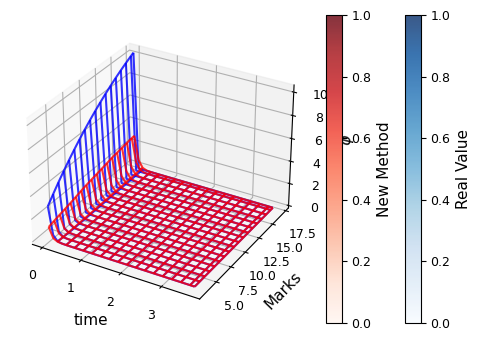

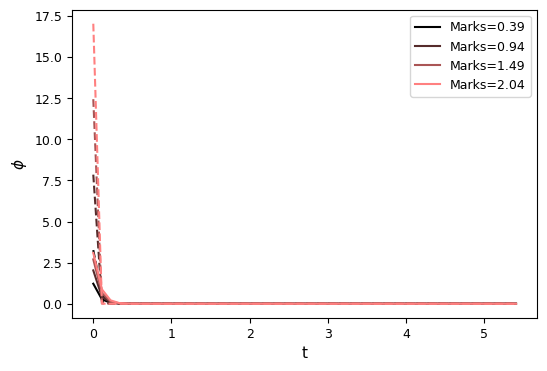

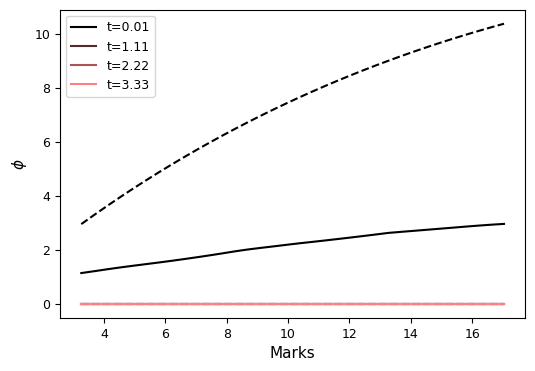

change
1201 6 1365.7270854444087 1365.7270854444087 0.7535412979516487


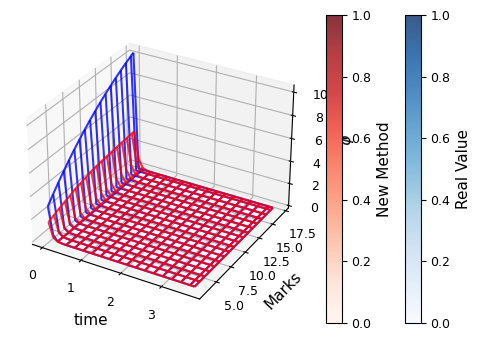

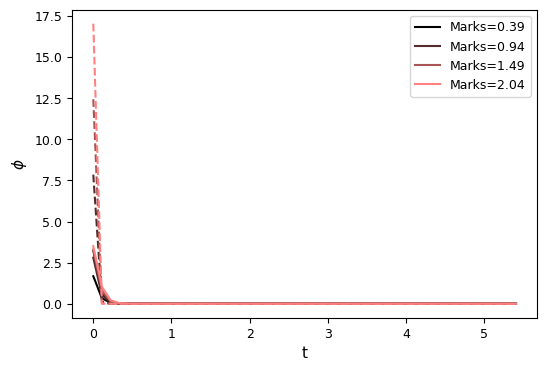

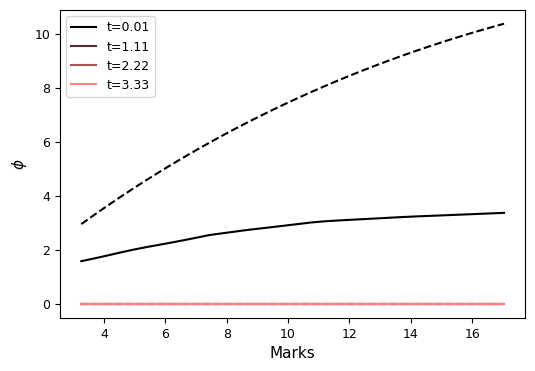

1201 7 1365.7270854444087 1367.8618398644244 0.7495748314220186


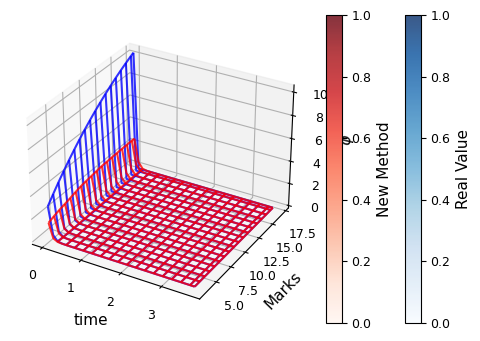

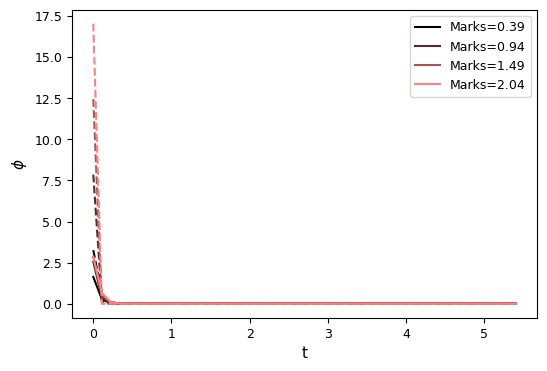

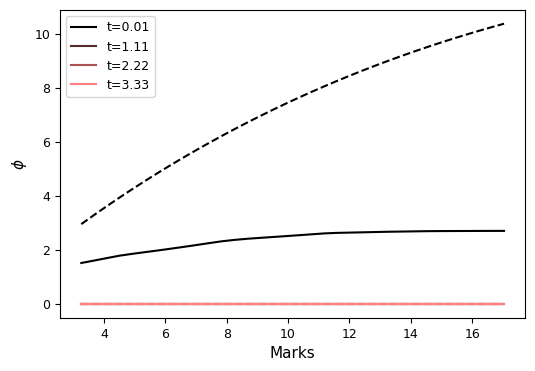

change
change
1201 8 1363.0715467964528 1363.0715467964528 0.7470556233240051


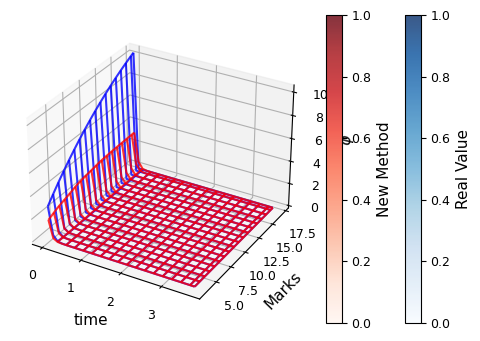

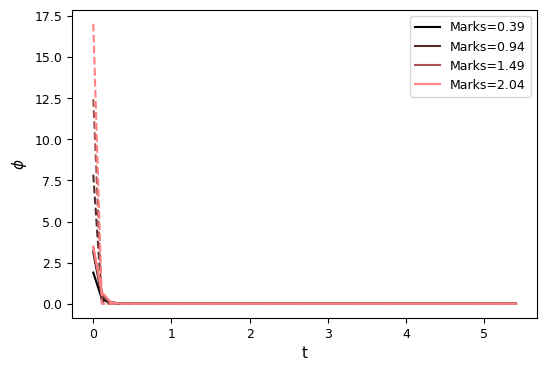

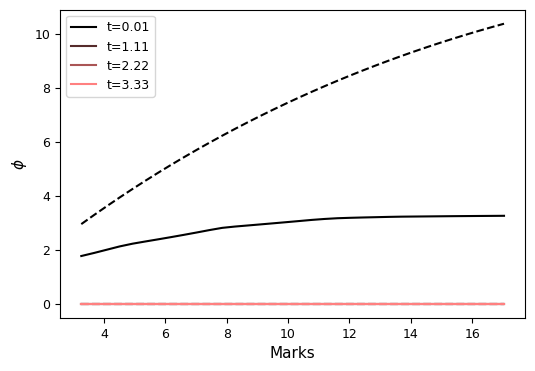

change
1201 9 1362.5016443307695 1362.5016443307695 0.7452181942889448


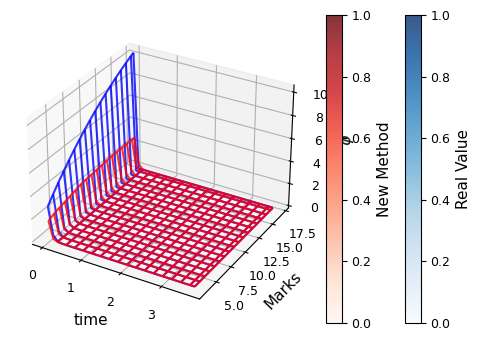

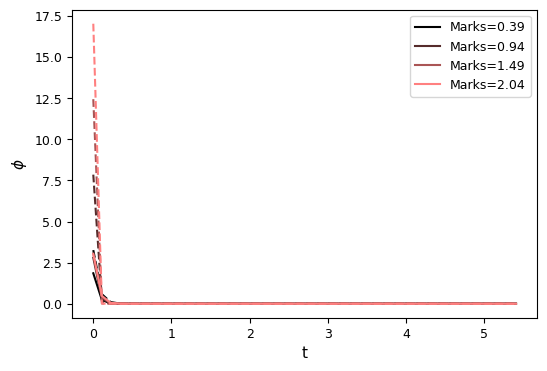

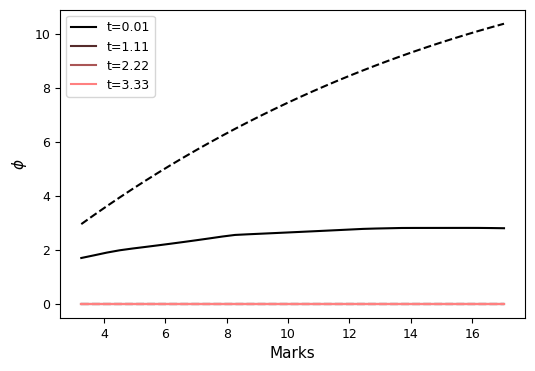

change
1201 10 1361.0619940500064 1361.0619940500064 0.7440278583236953


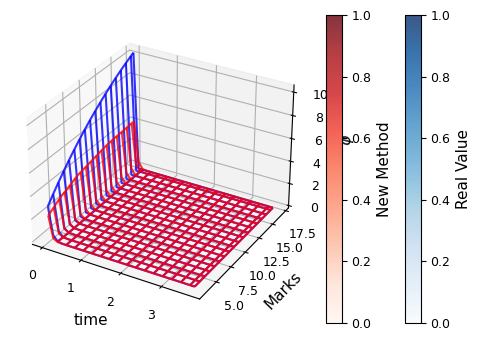

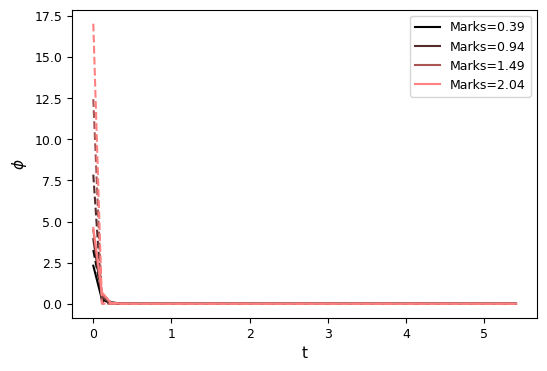

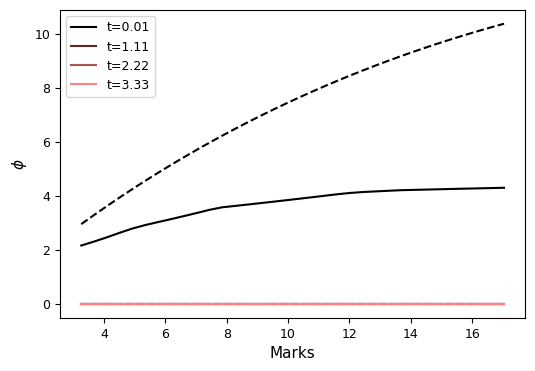

1201 11 1361.0619940500064 1361.702307204552 0.7441291634446615


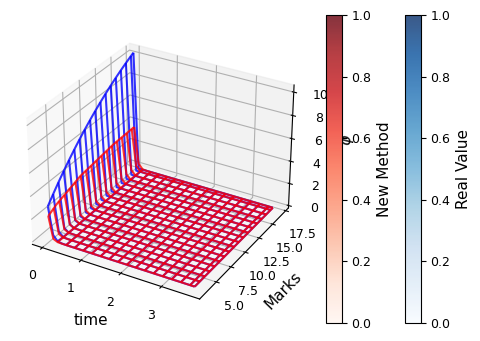

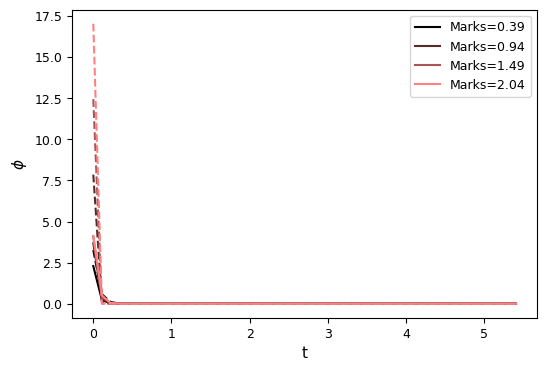

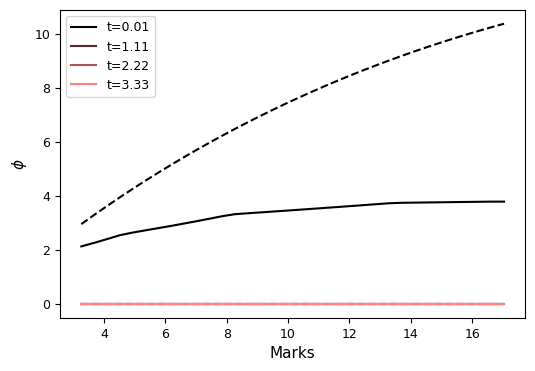

change
change
1201 12 1359.9949234446992 1359.9949234446992 0.7418283939443177


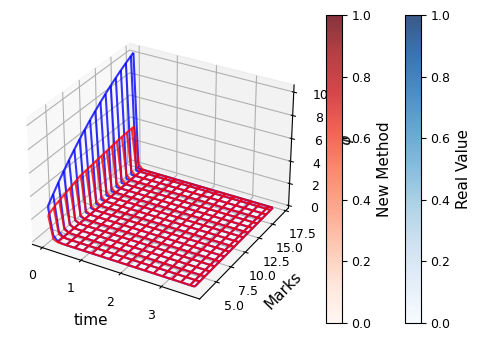

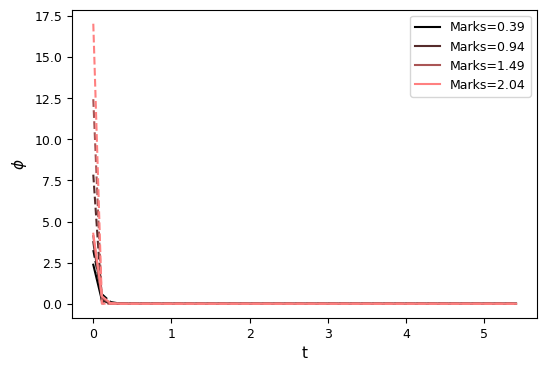

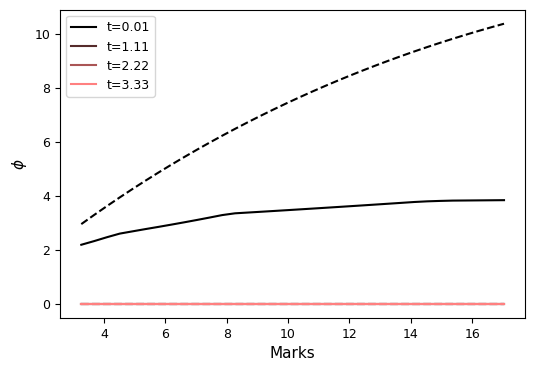

change
1201 13 1359.1403014735565 1359.1403014735565 0.7418521407091982


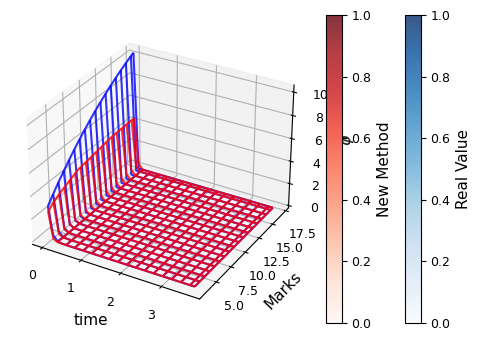

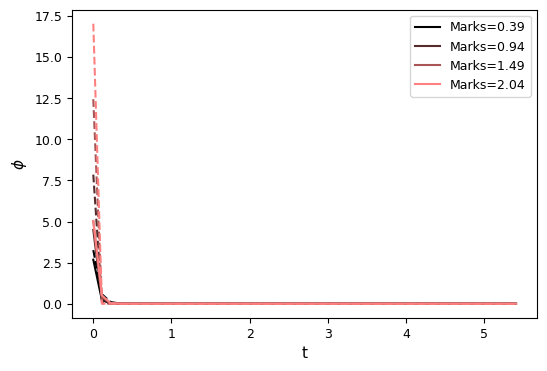

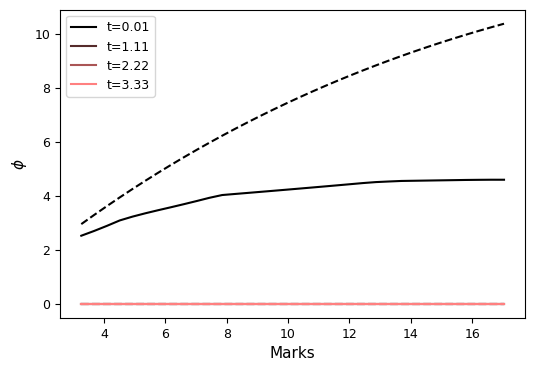

1201 14 1359.1403014735565 1361.1245774134777 0.7431480107340928


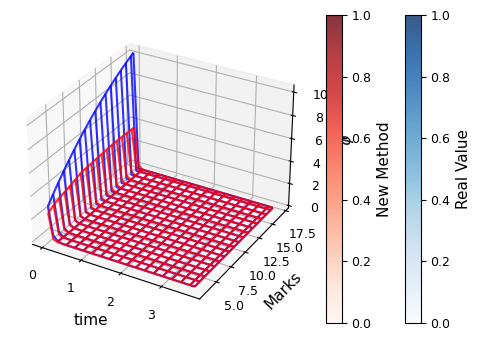

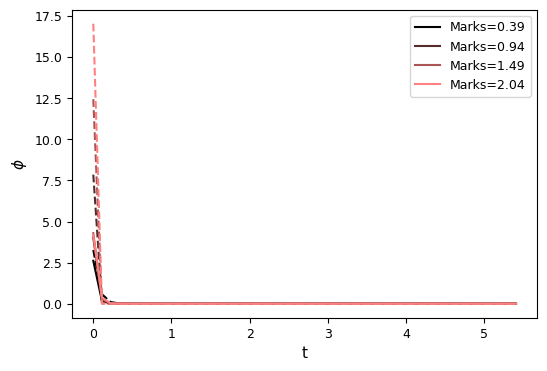

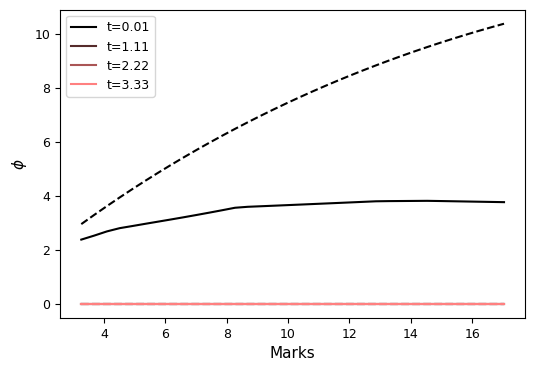

change
1201 15 1358.500300725676 1358.8898087543716 0.7425196359655574


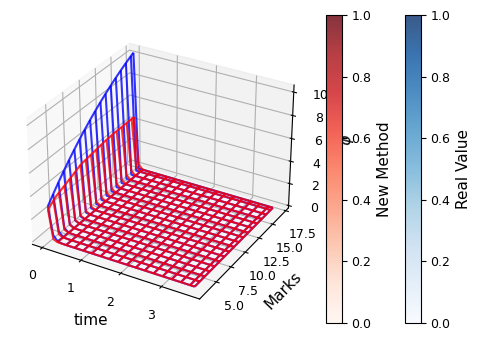

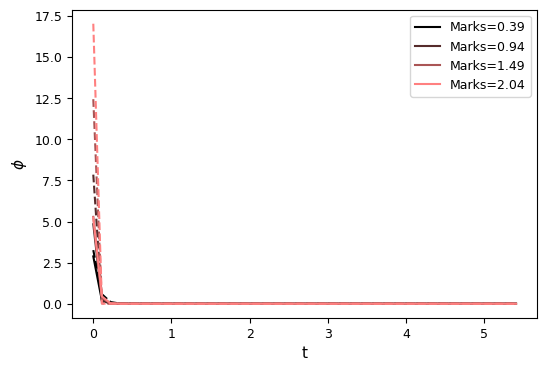

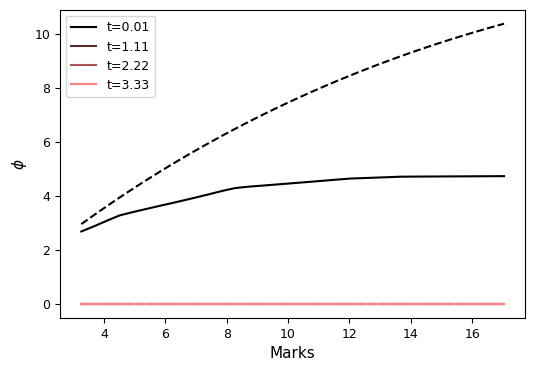

1201 16 1358.500300725676 1358.8078732438469 0.7433688692901789


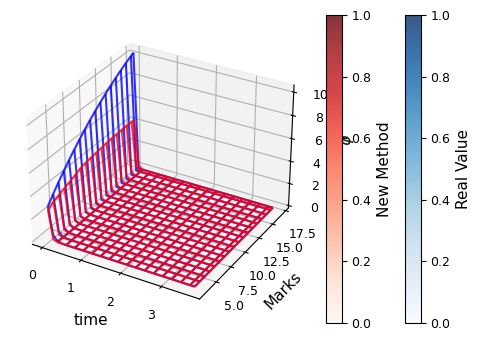

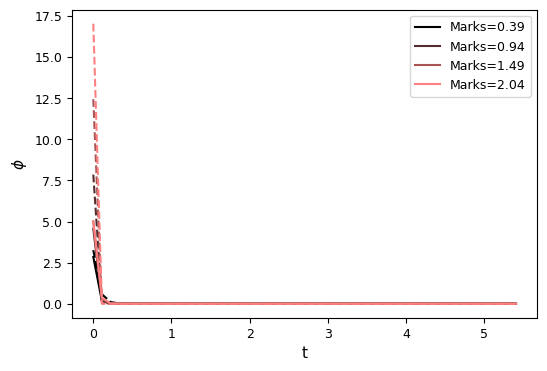

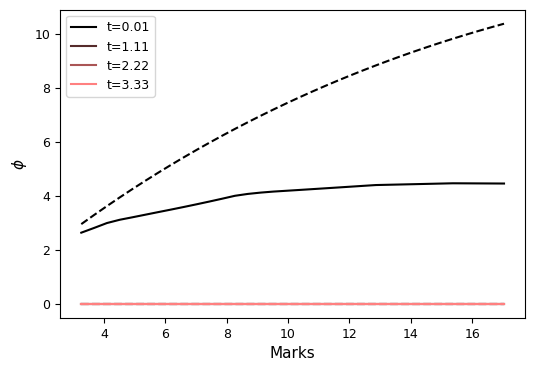

1201 17 1358.500300725676 1358.6127094219555 0.7420977437655822


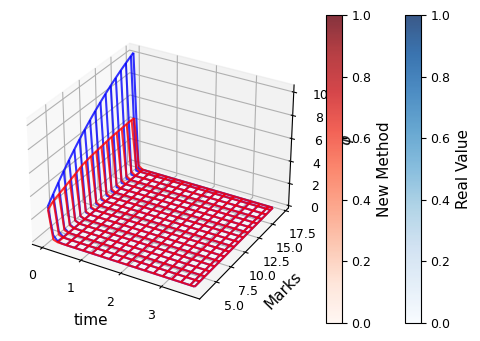

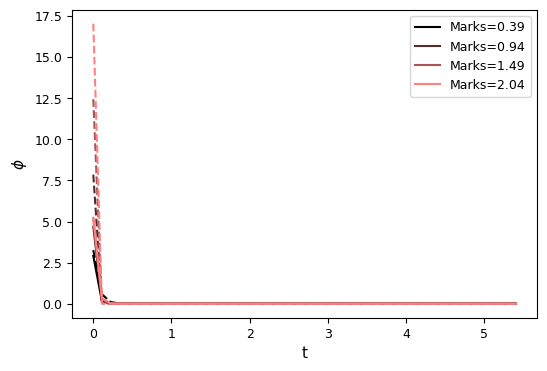

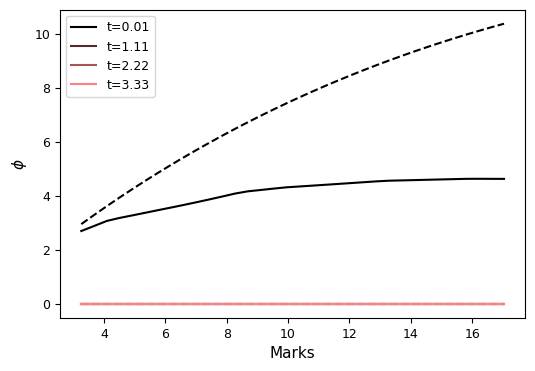

change
change
1201 18 1357.7062116460916 1357.7062116460916 0.7419859827366175


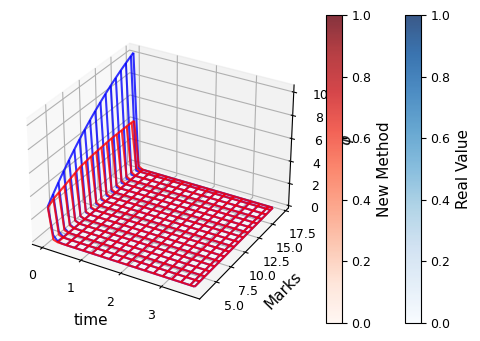

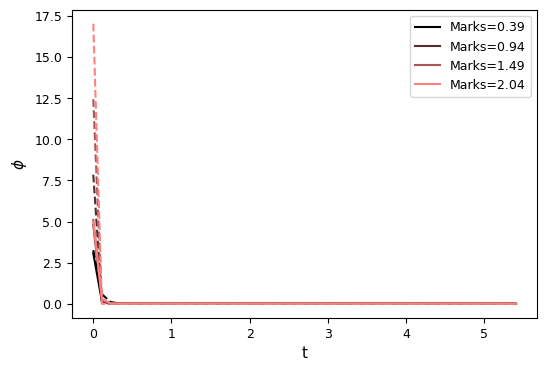

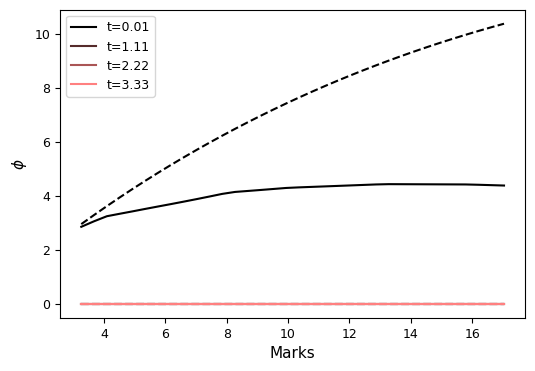

change
1201 19 1357.4479434734576 1357.4479434734576 0.7436541244819329


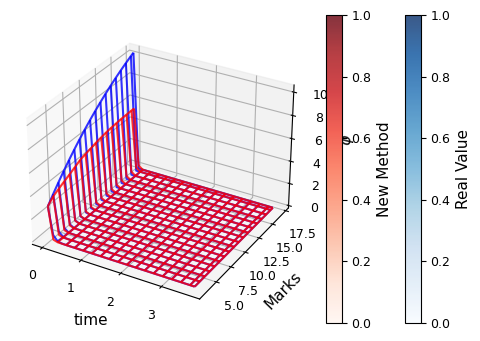

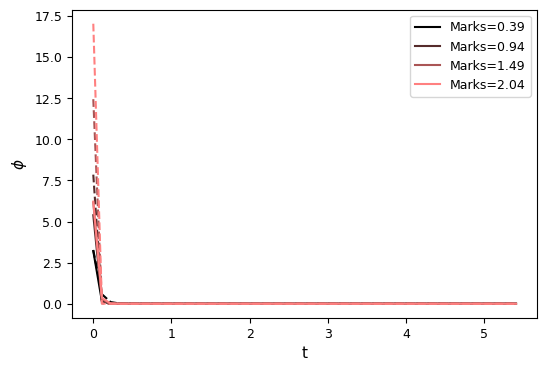

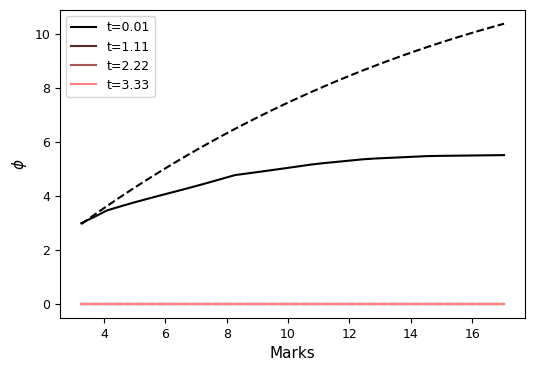

1201 20 1357.4479434734576 1359.1260513977472 0.7434163884590244


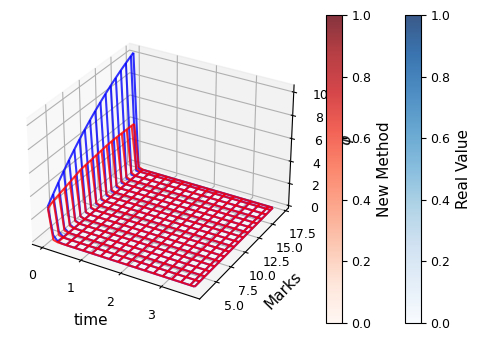

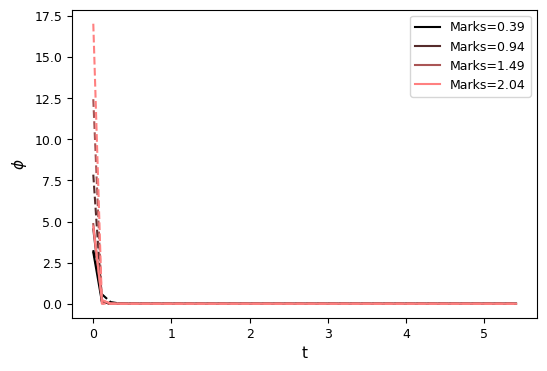

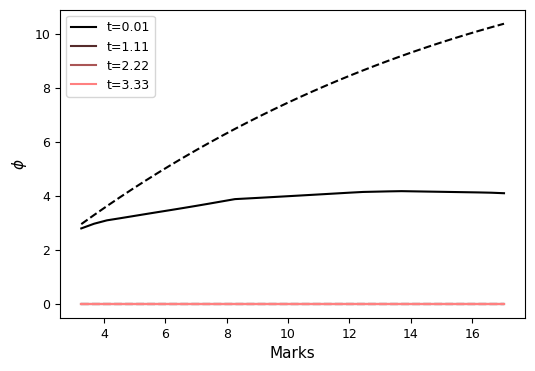

change
1201 21 1357.105968458243 1357.105968458243 0.7434811185095617


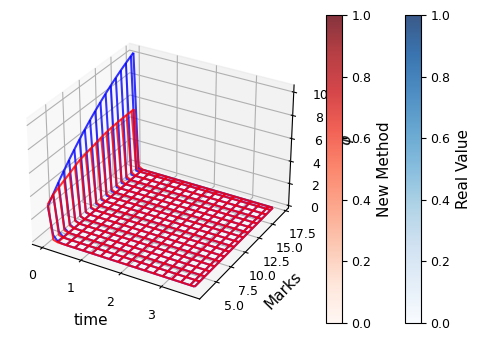

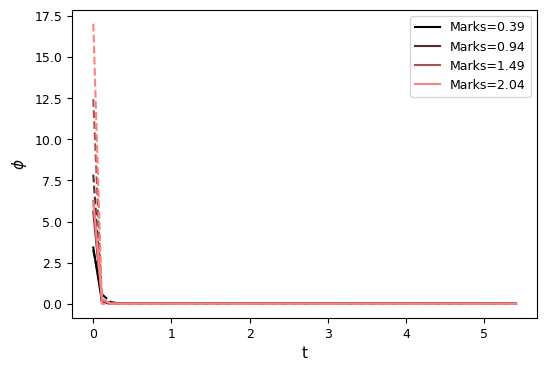

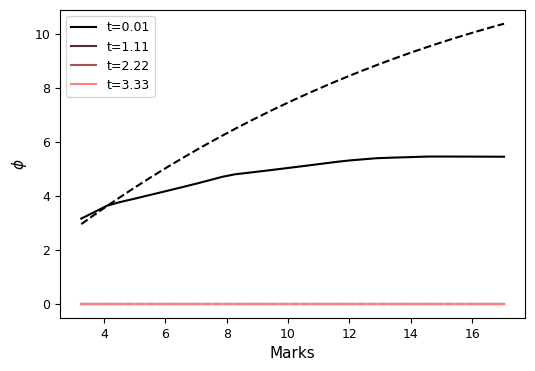

1201 22 1357.105968458243 1357.2064662439157 0.7443512323848103


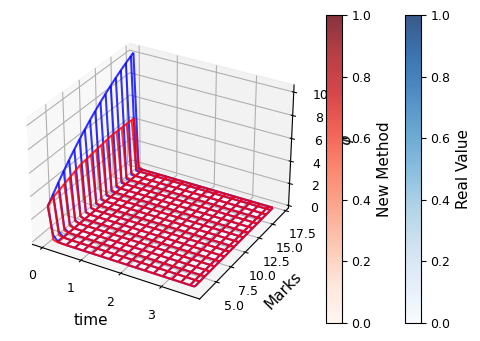

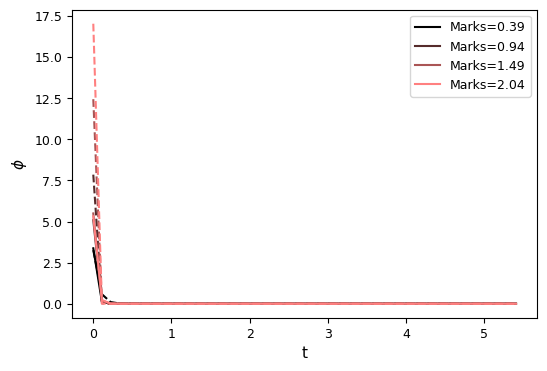

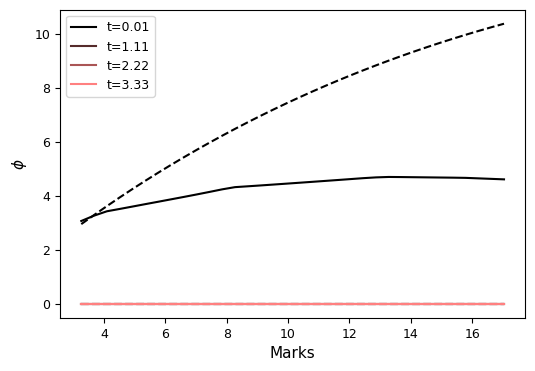

change
1201 23 1356.9952218220603 1356.9952218220603 0.744232880822237


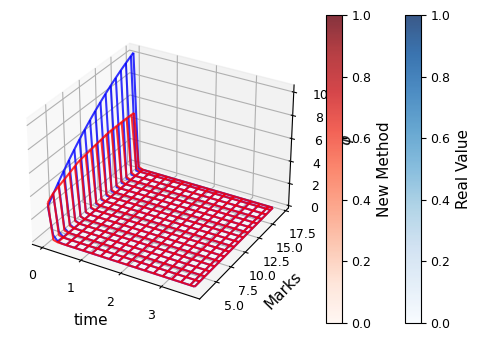

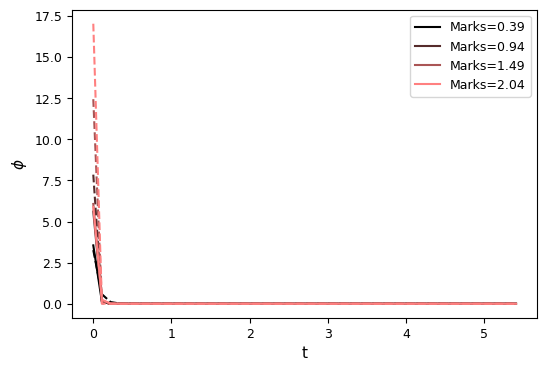

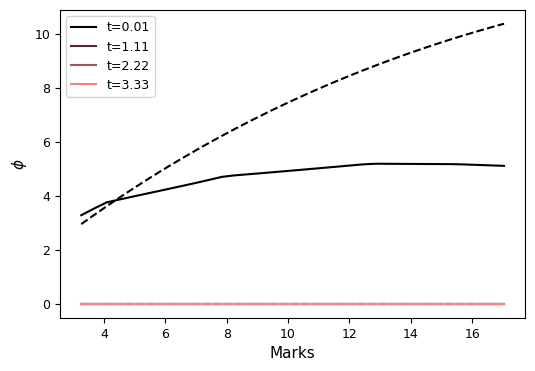

1201 24 1356.9952218220603 1357.534572394491 0.7456516783300212


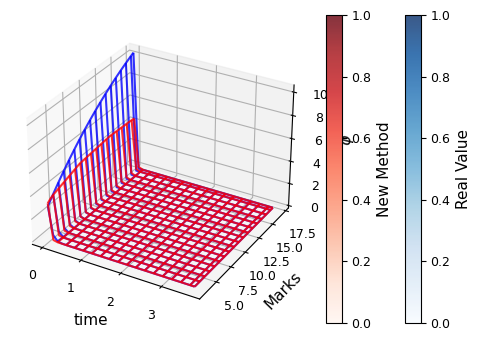

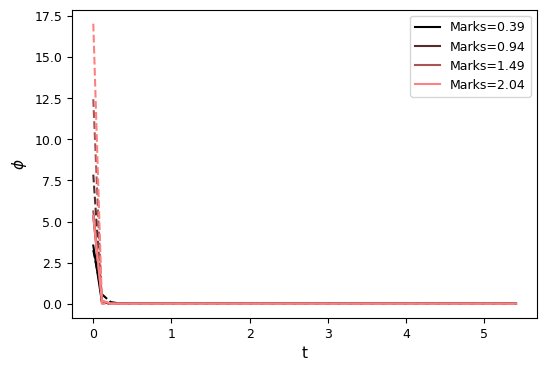

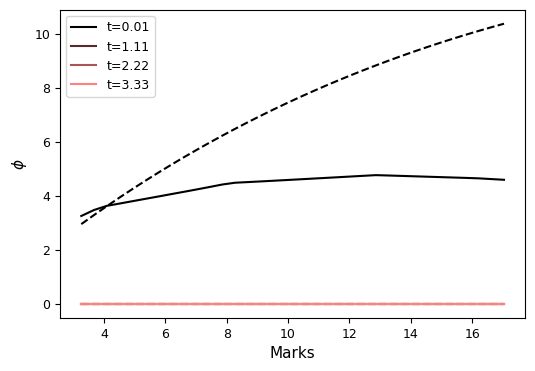

change
1201 25 1356.7207825613307 1357.4813061709094 0.7453533854803298


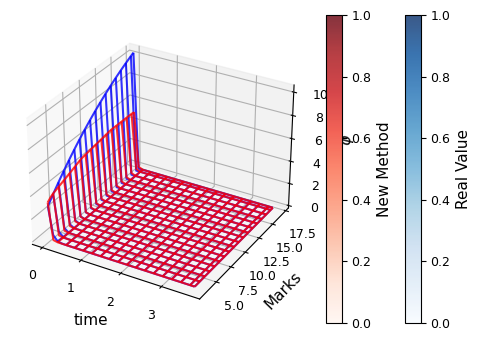

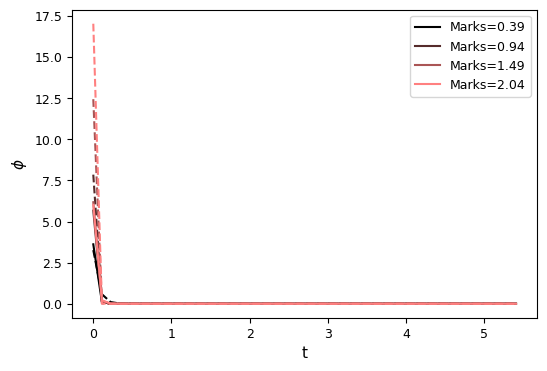

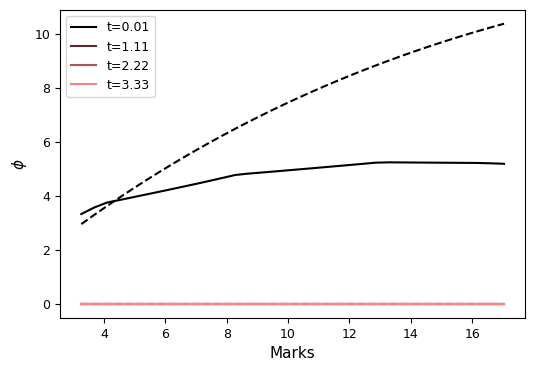

change
1201 26 1356.465419901673 1356.465419901673 0.7458637162564549


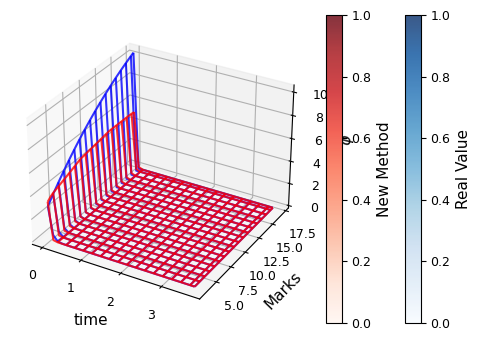

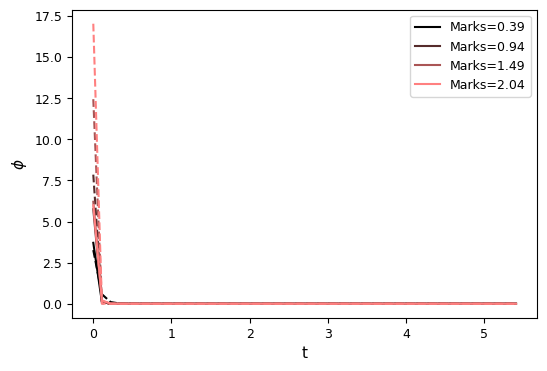

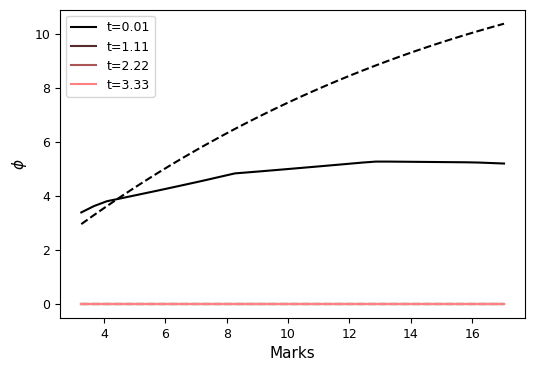

1201 27 1356.465419901673 1357.4330834366604 0.7453804300441691


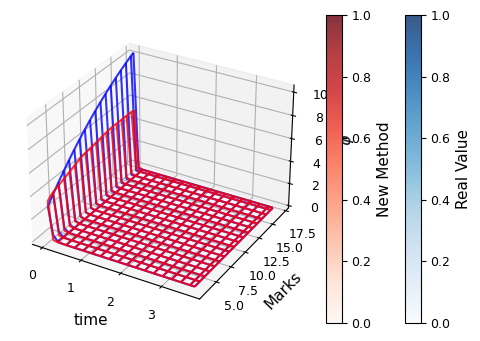

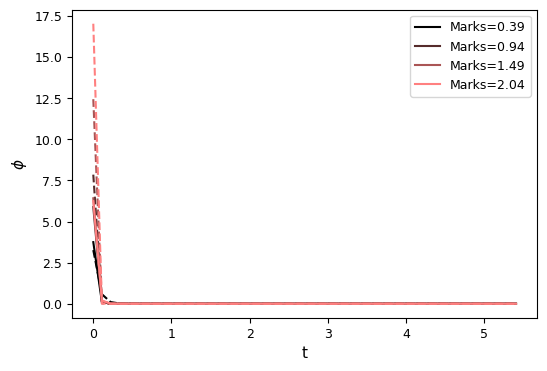

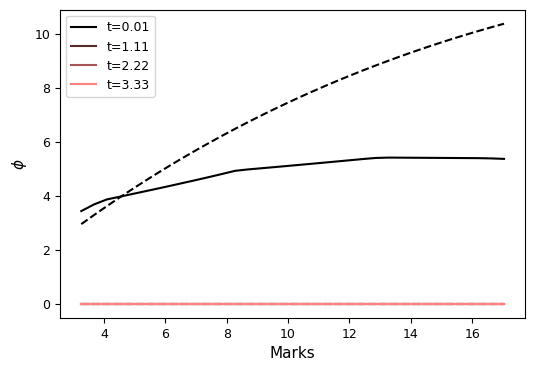

change
1201 28 1356.4123194029178 1356.5069377273537 0.7460852385371524


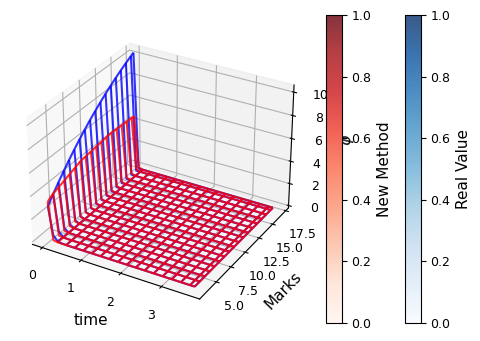

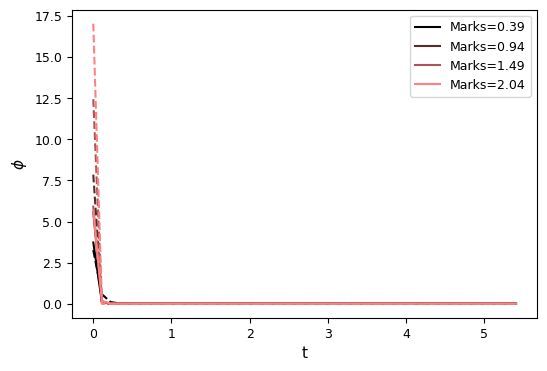

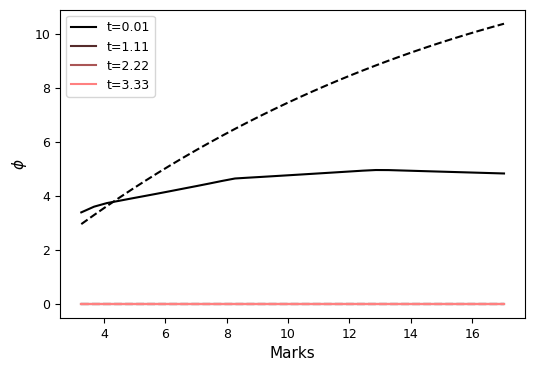

1201 29 1356.4123194029178 1356.7662494579693 0.7459150823641758


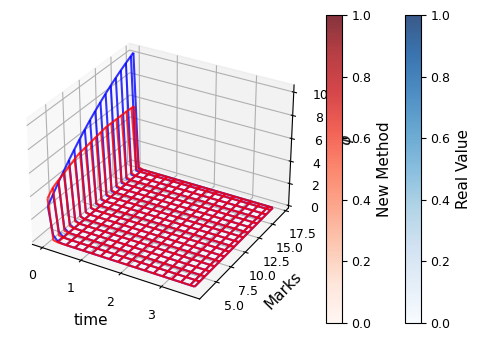

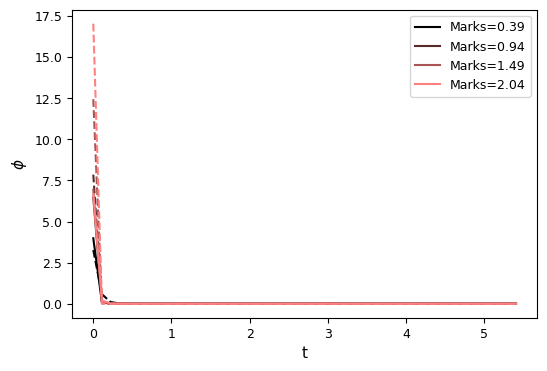

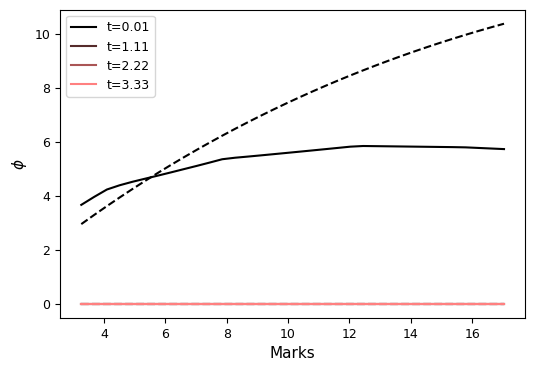

1201 30 1356.4123194029178 1358.0142345329266 0.7459777570624132


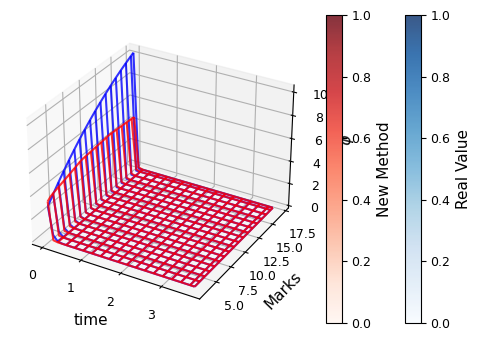

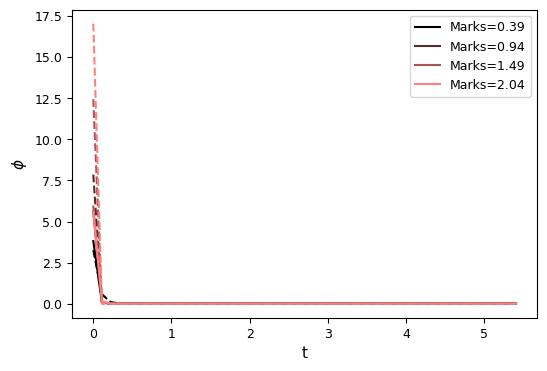

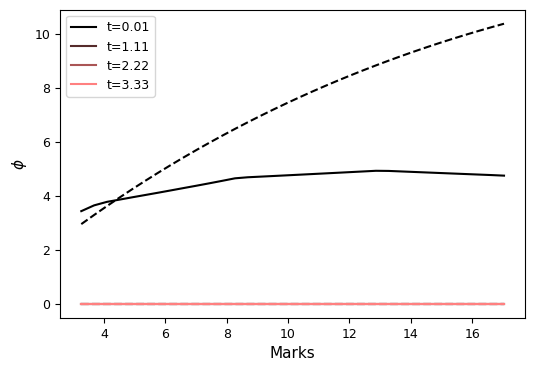

change
1201 31 1356.1620979427812 1356.1620979427812 0.745878426745926


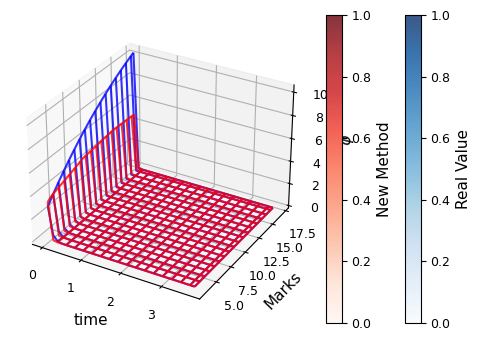

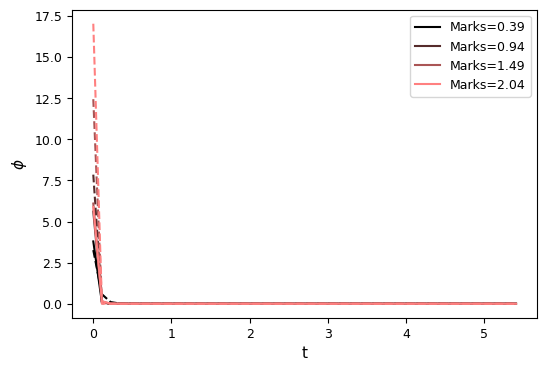

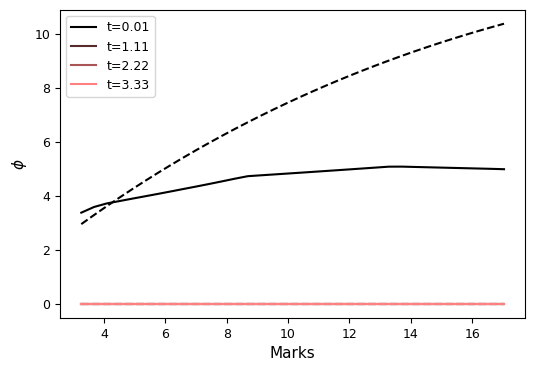

1201 32 1356.1620979427812 1356.9010330433273 0.7466784485124995


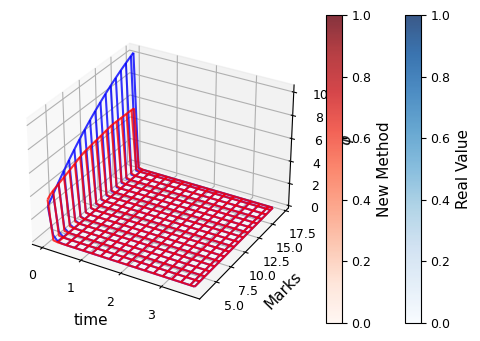

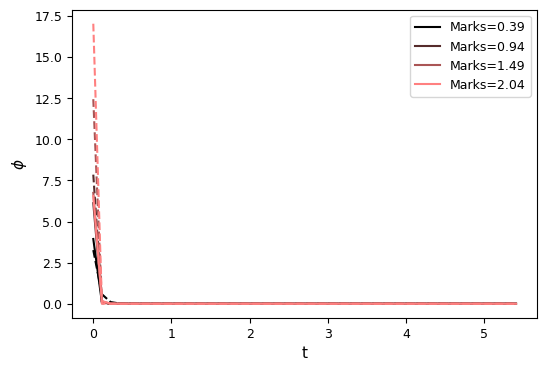

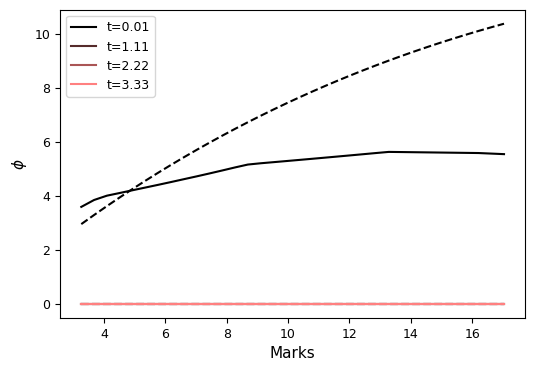

1201 33 1356.1620979427812 1356.848655299121 0.7473242924282623


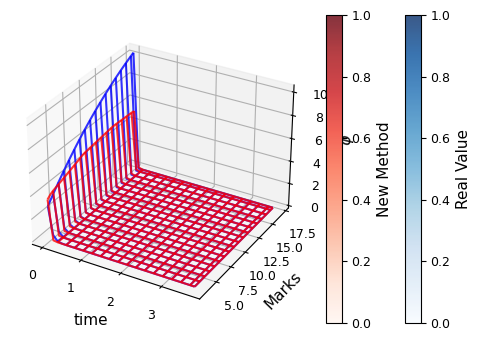

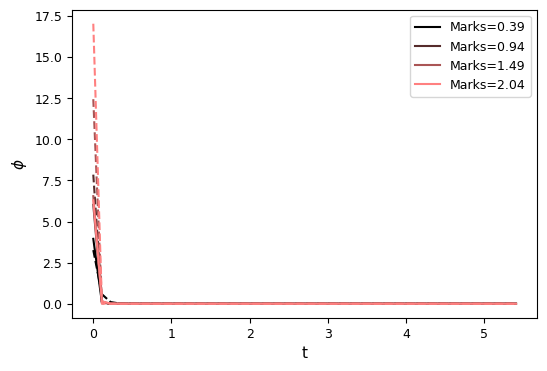

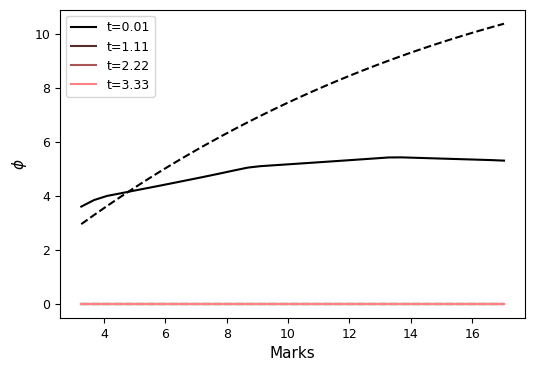

change
1201 34 1356.1003625742842 1356.1003625742842 0.7478026515117324


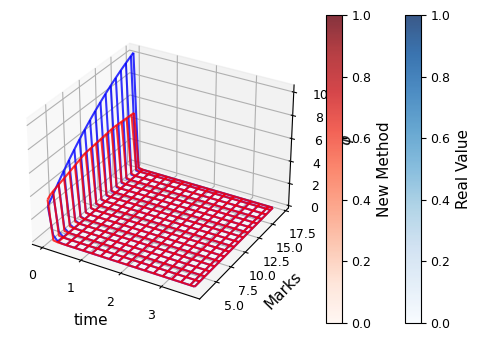

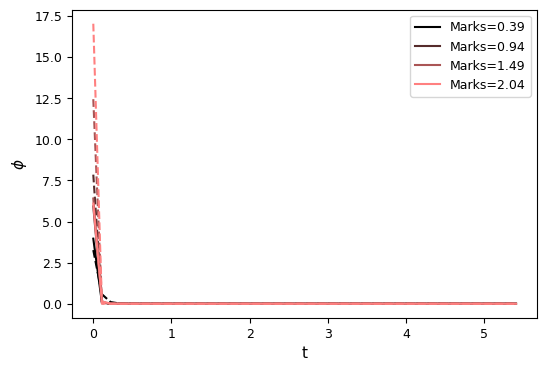

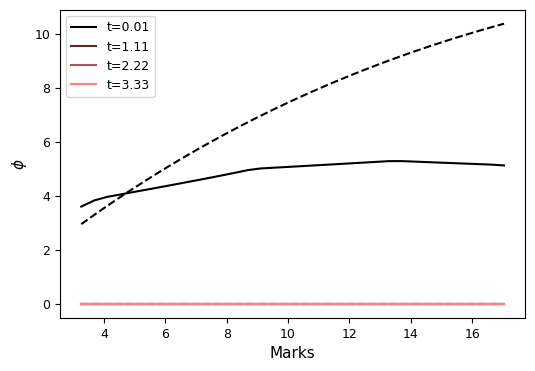

1201 35 1356.1003625742842 1356.5591343563171 0.7483597749963128


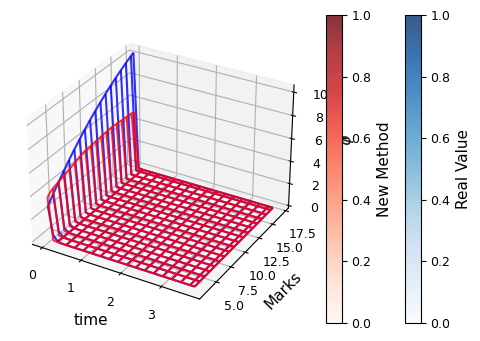

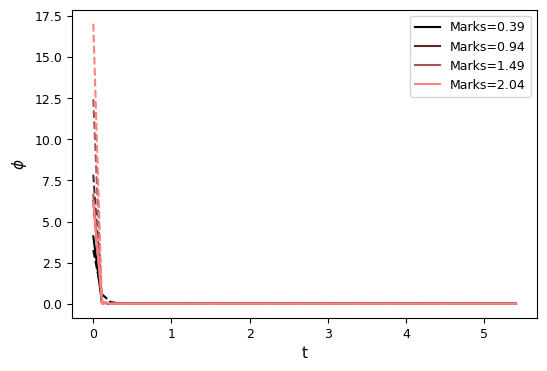

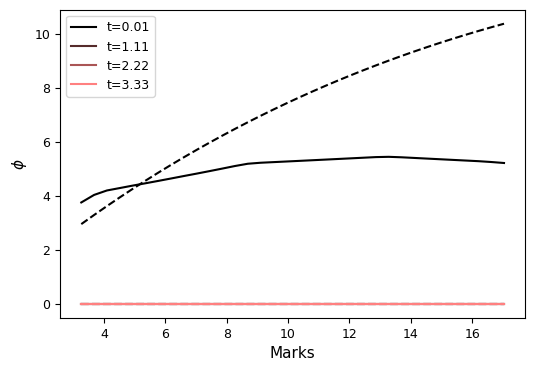

1201 36 1356.1003625742842 1356.2988392676675 0.748466174593929


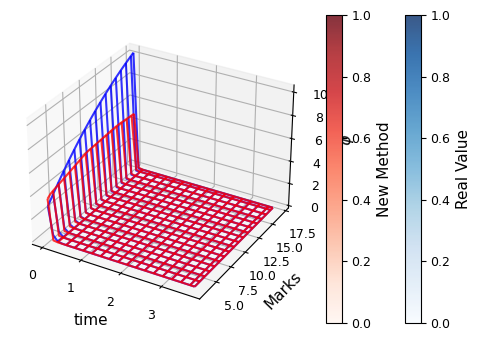

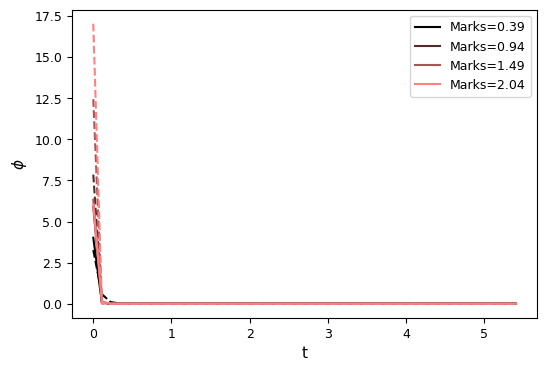

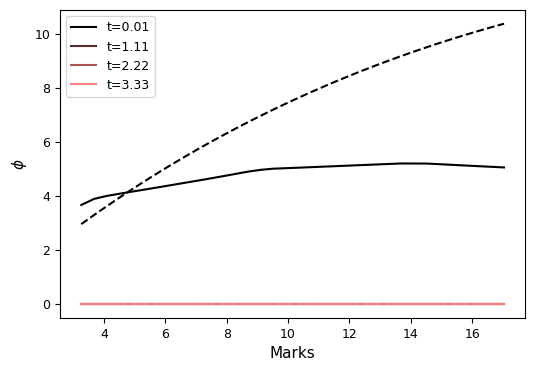

change
1201 37 1356.0015314315388 1356.0015314315388 0.7487996310590406


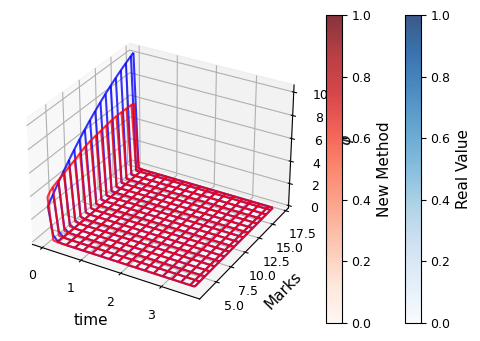

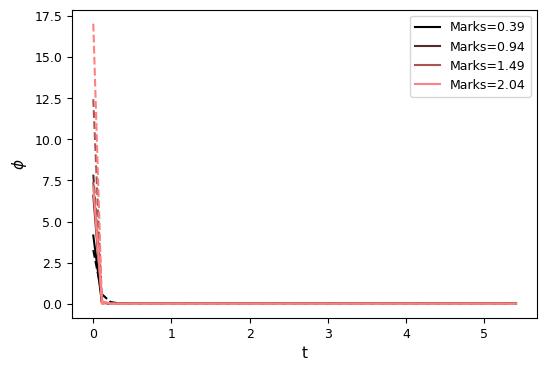

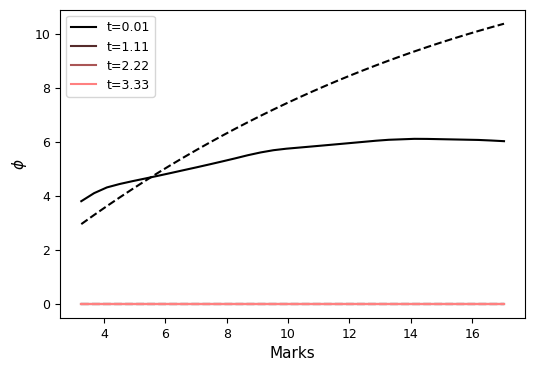

1201 38 1356.0015314315388 1356.3496716644918 0.7490493852509379


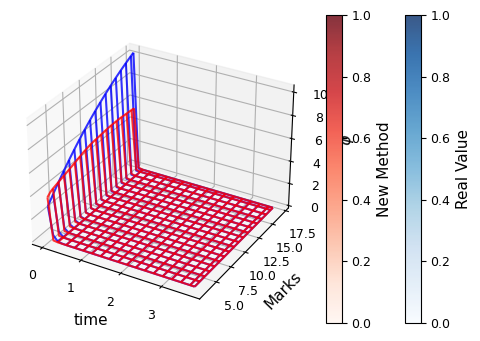

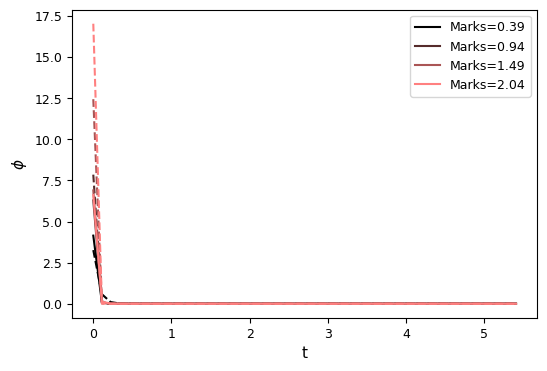

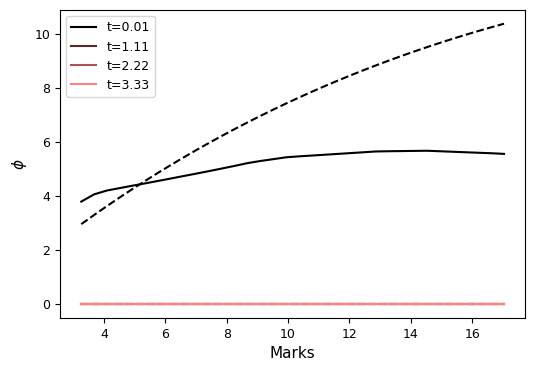

1201 39 1356.0015314315388 1356.2736369658387 0.7498852166014971


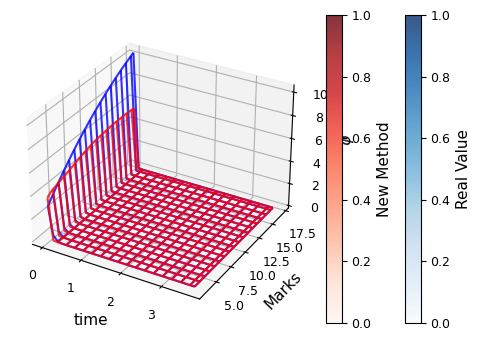

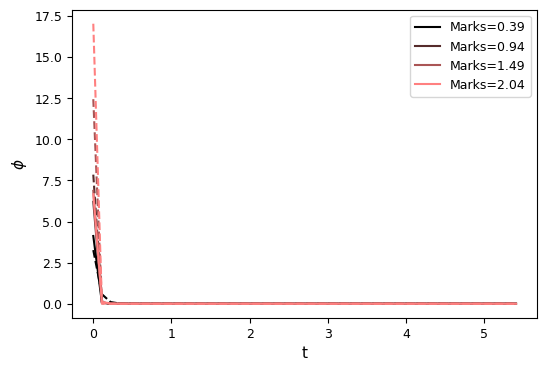

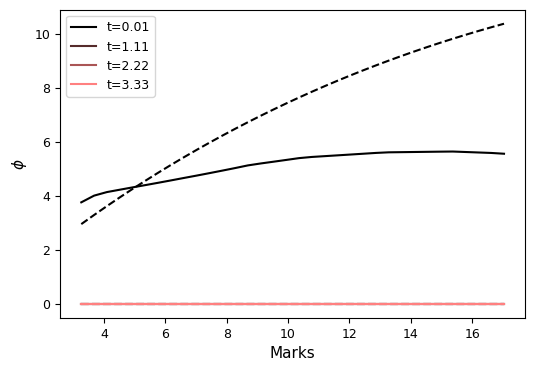

1201 40 1356.0015314315388 1356.286684231158 0.749498509631921


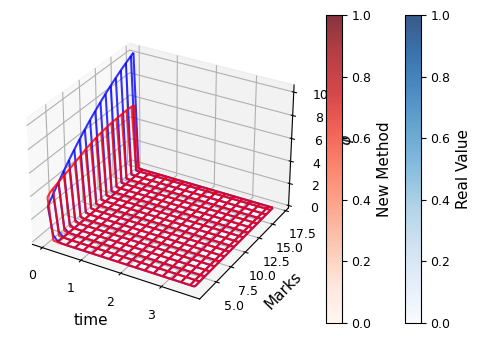

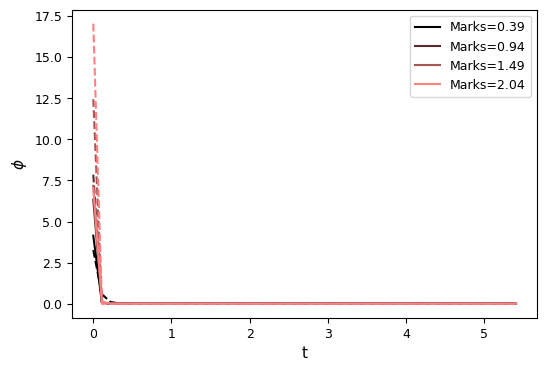

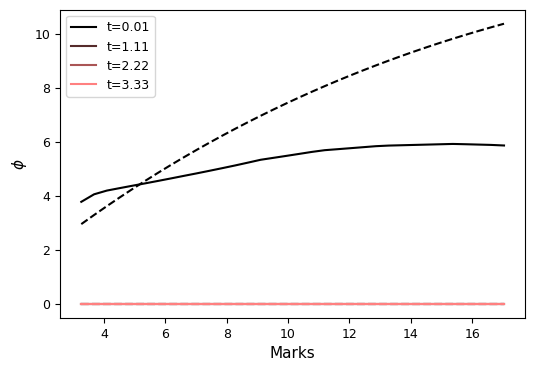

1201 41 1356.0015314315388 1356.3253171996637 0.750303899366175


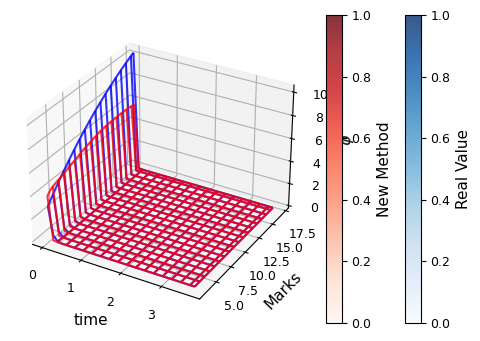

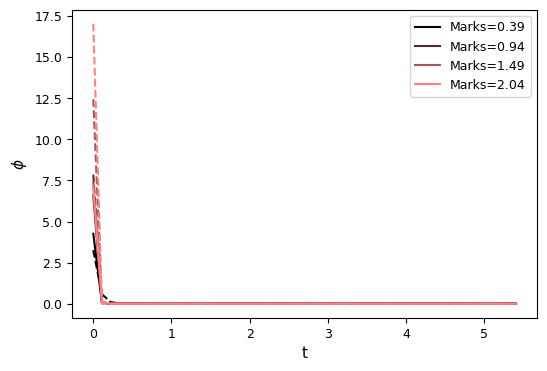

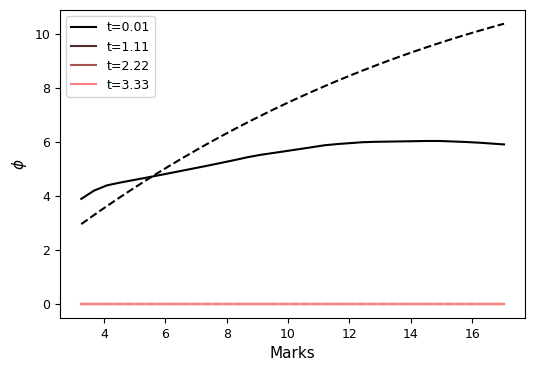

1201 42 1356.0015314315388 1356.0043569534437 0.7505890436922121


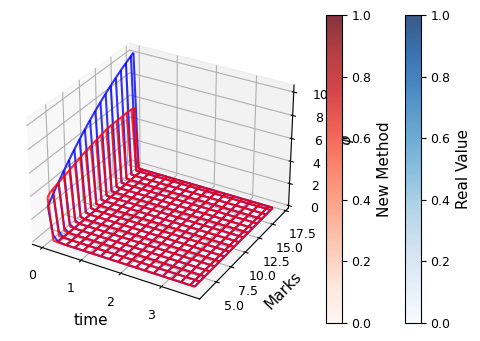

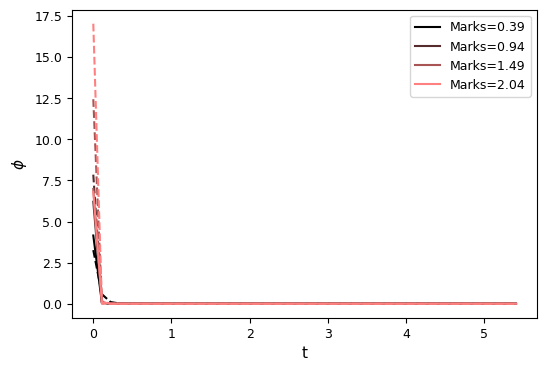

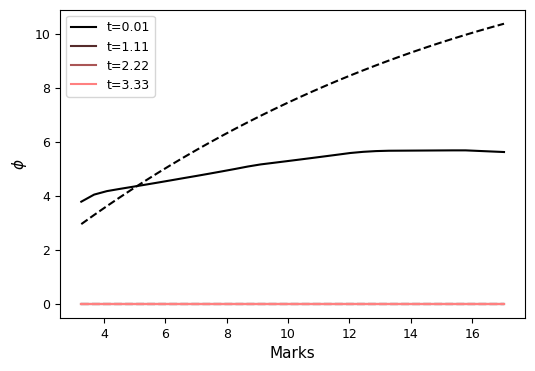

1201 43 1356.0015314315388 1356.958675344777 0.7507850385604314


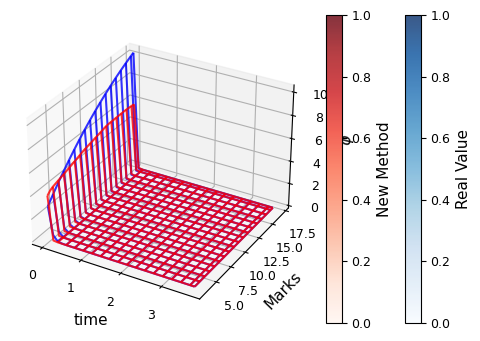

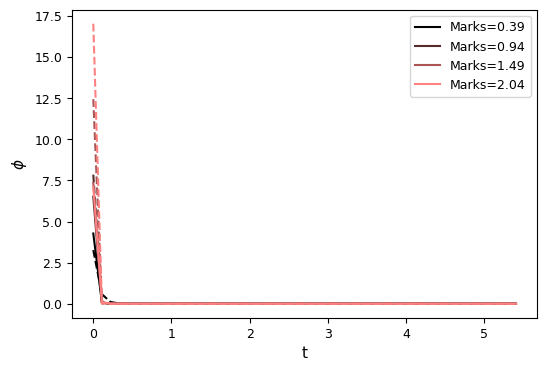

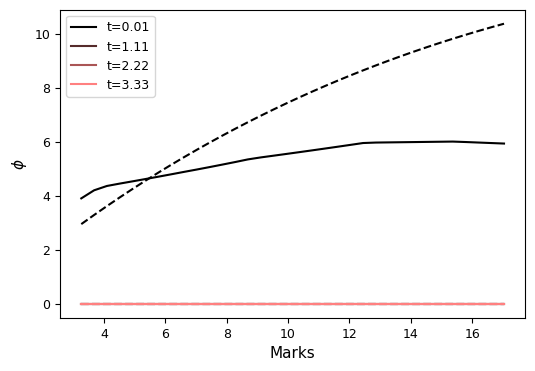

1201 44 1356.0015314315388 1356.2637175734735 0.7515101736514382


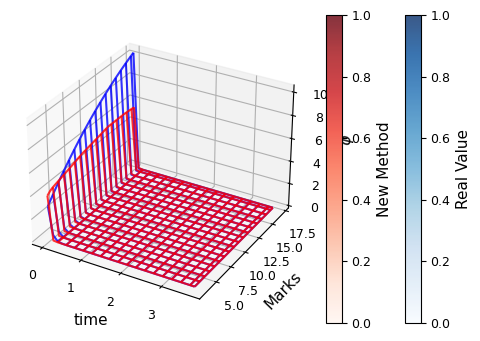

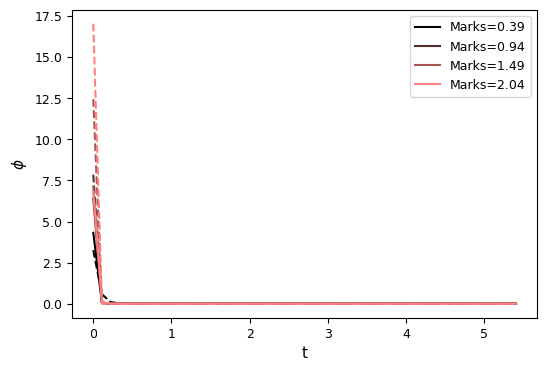

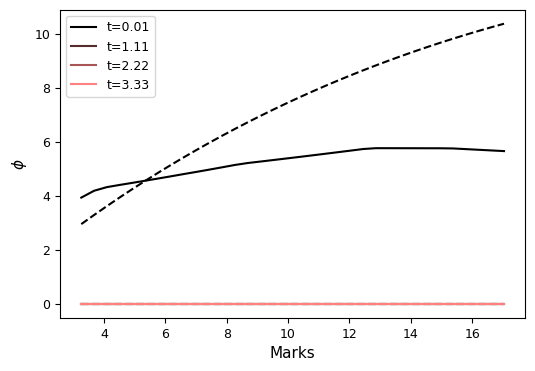

change
1201 45 1355.9582163174716 1355.9582163174716 0.752472468467339


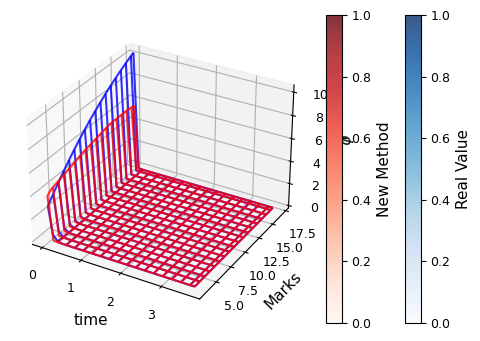

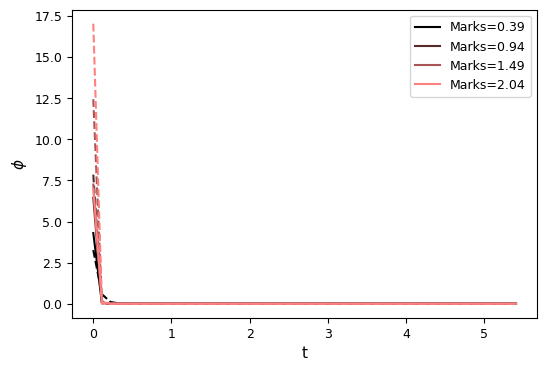

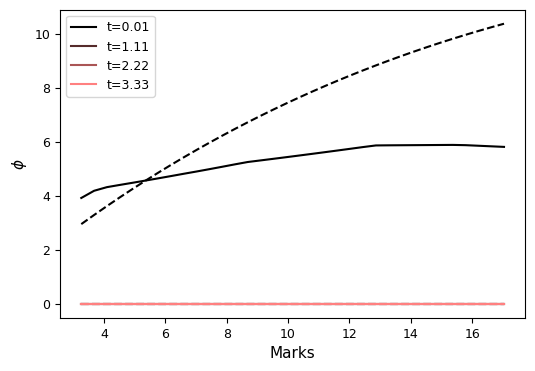

1201 46 1355.9582163174716 1357.3938065874704 0.7525419398492009


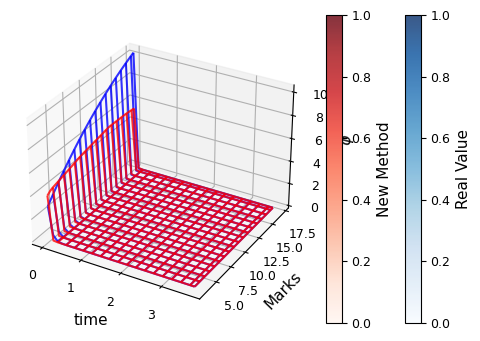

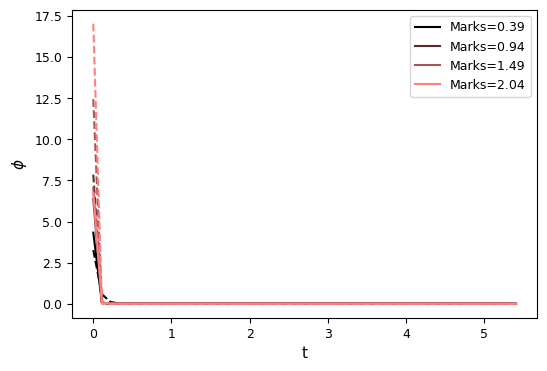

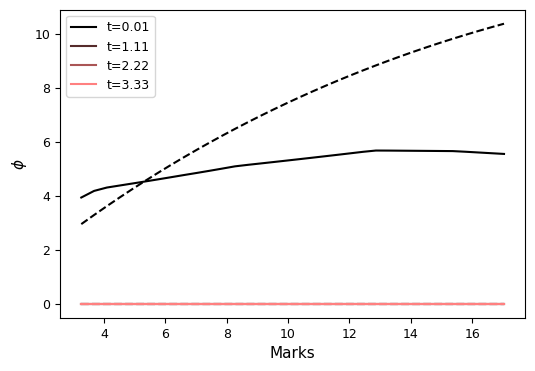

change
1201 47 1355.8604526594625 1355.8604526594625 0.751433635739195


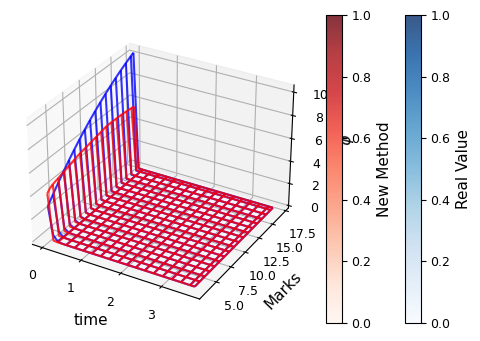

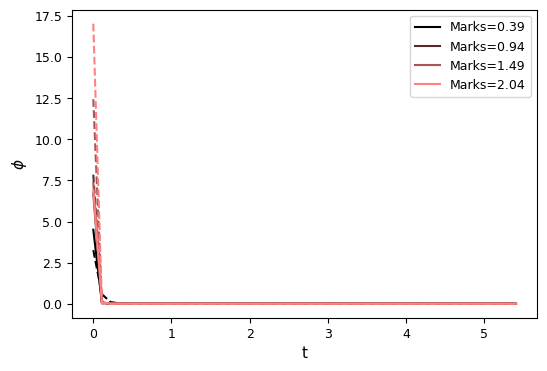

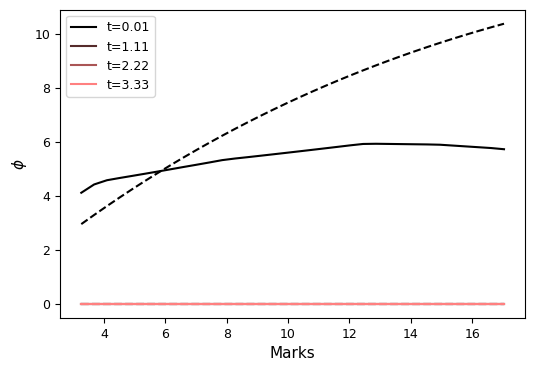

1201 48 1355.8604526594625 1356.2827388315268 0.7514110605521764


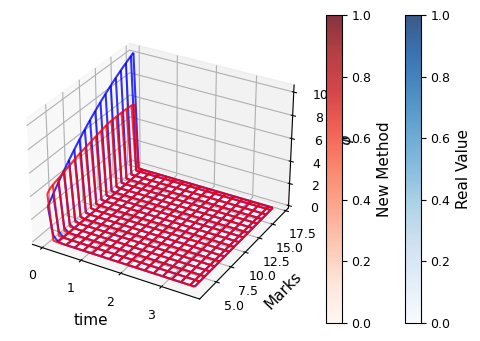

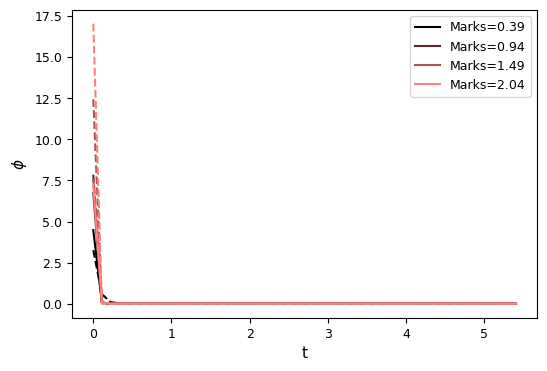

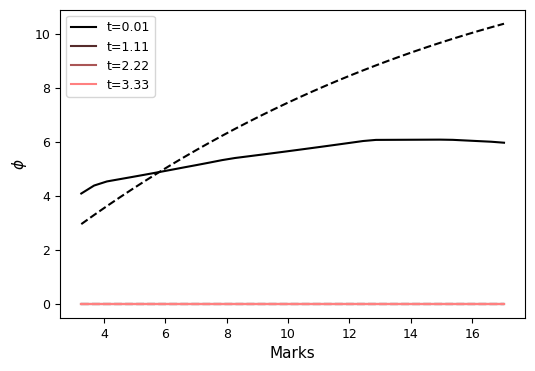

1201 49 1355.8604526594625 1356.2228791240846 0.7510286833854468


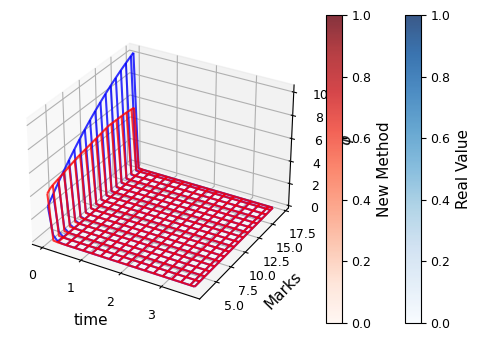

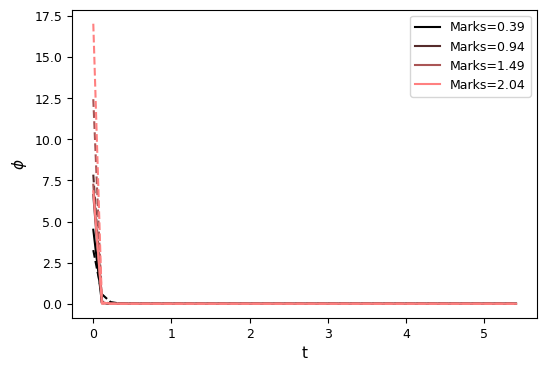

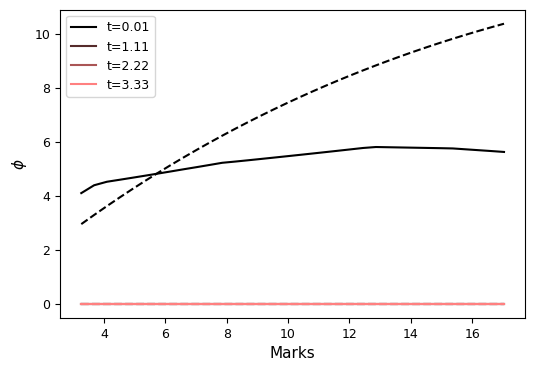

1201 50 1355.8604526594625 1355.9243128046792 0.7518219471391566


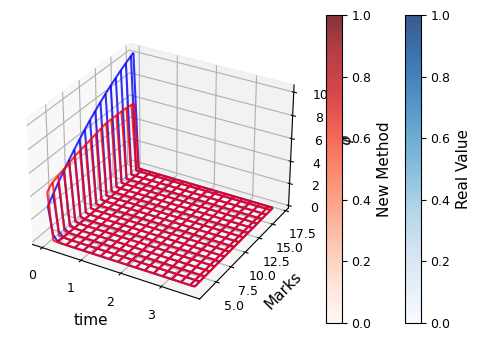

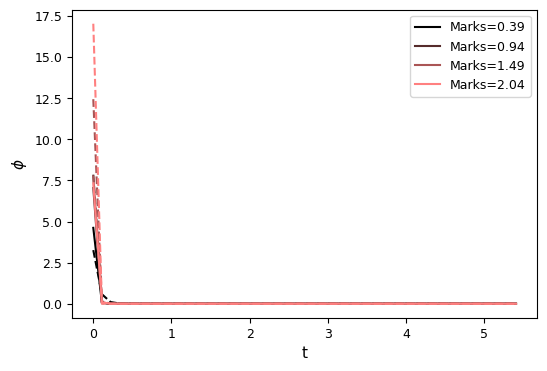

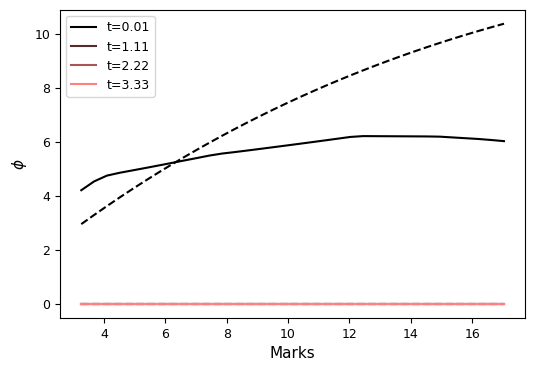

1201 51 1355.8604526594625 1356.7748418910187 0.7531602038674298


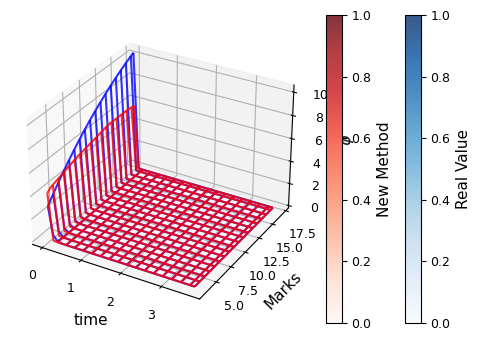

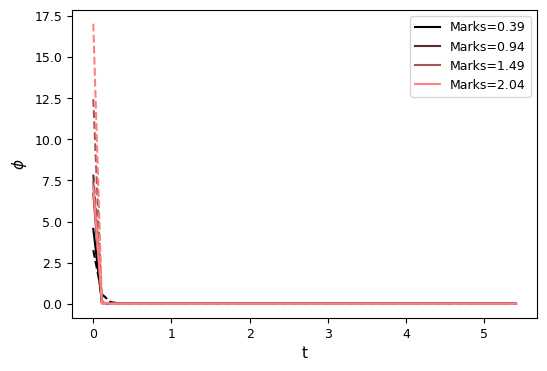

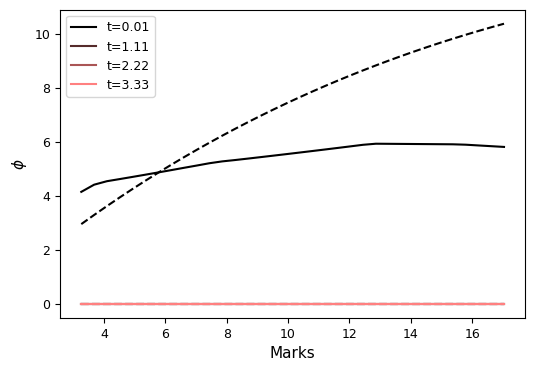

1201 52 1355.8604526594625 1356.5746335613017 0.7529161048564698


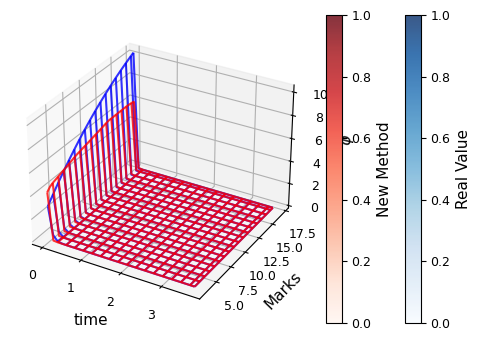

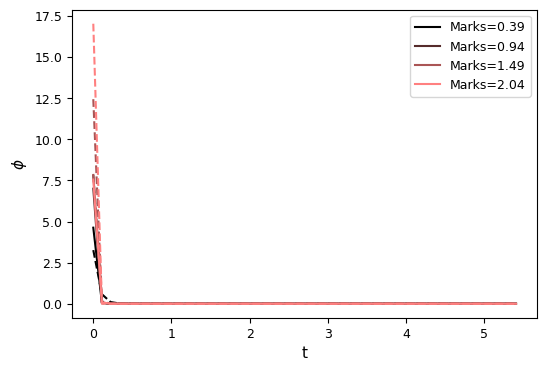

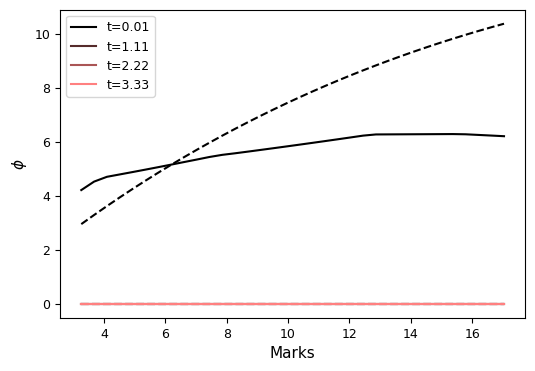

1201 53 1355.8604526594625 1356.3388739002776 0.7525400114921602


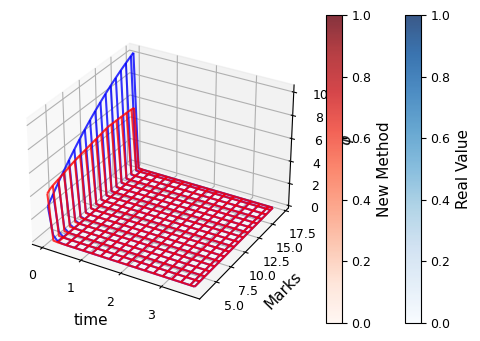

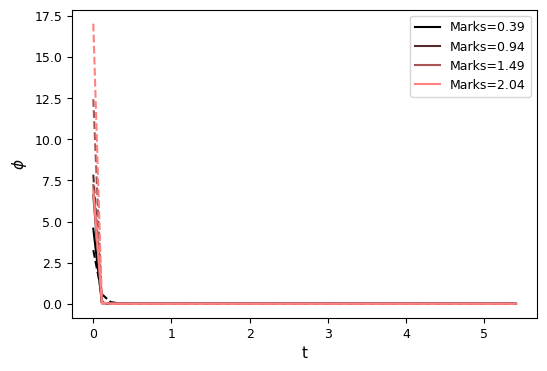

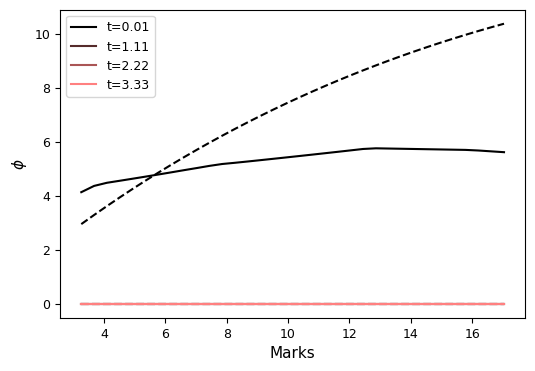

1201 54 1355.8604526594625 1356.1470299618088 0.7534878205389904


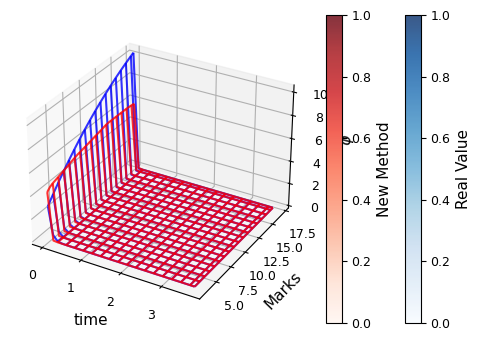

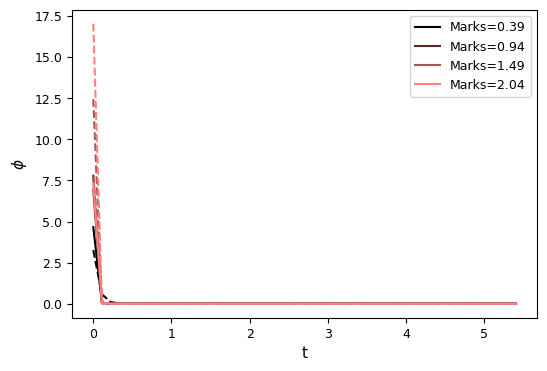

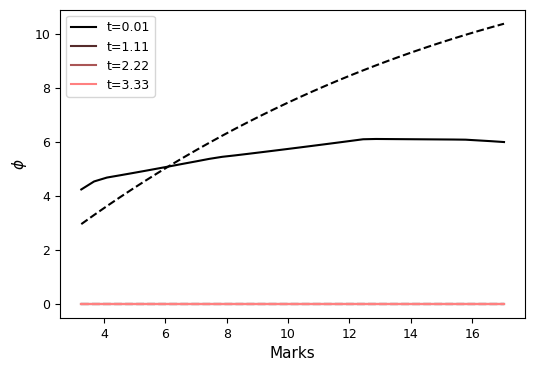

1137.3498086929321


In [72]:
import time
kernelMarks="combined"
%matplotlib inline
supportTraindata=support=1000
A=[]
B=[]
A_grad=[]
B_grad=[]
M=[]
gradM=[]


epsilon = 1e-8

Dict={}

kernelType = 0
mu_t,theta = 0.7,7.0
beta=5.0
T=2000
t1,marksO=simu_univariateMarked2(mu_t,T,beta_0,beta_1,mean=mean,variance=variance)
#t,marks=sell_t,utc_sell_v
fac=len(t1)/t1[-1]
facM=1/np.mean(marksO)


tscale=t1*fac
marks1=marksO*facM
print("original Likelihood",loglikelihood([theta,beta,mu_t],t1,marksO))
markFunctionLL= mark_distribution(marks1)

nNeurons=64
nNeuronsM=50
lr=0.02
mu=initializeParams(nNeurons,nNeuronsM)
start=time.time()
markedSNH=sgdNeuralHawkes(100,lr,mu,tscale,marks1)
print(time.time()-start)
timestr = time.strftime("%Y%m%d-%H%M%S")

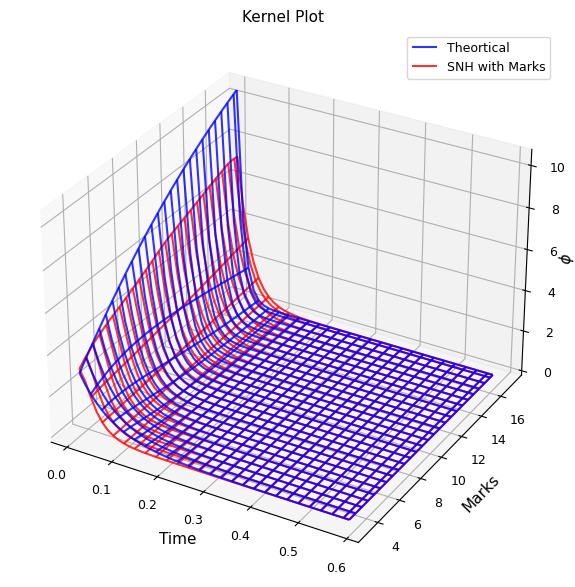

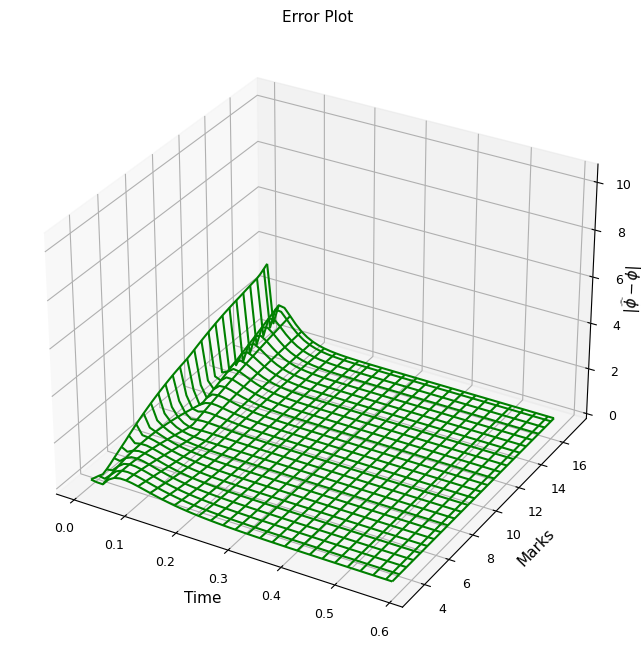

In [61]:
%matplotlib inline

def optimalValues():
    optimalAlphas=markedSNH[0][0]
    optimalAlpha0=markedSNH[0][1]
    optimalBetas1=markedSNH[0][2]
    optimalBetas2=markedSNH[0][3]
    optimalBeta0=markedSNH[0][4]
    optimalMu=markedSNH[0][5]/fac
    return optimalAlphas,optimalAlpha0,optimalBetas1,optimalBetas2,optimalBeta0,optimalMu

def nnKernelOptimal(x,mark):
    alphas,alpha0,betas1,betas2,beta0,mu=optimalValues()
    x=x.reshape(1,-1)
    markI=mark.reshape(1,-1)
    n1 = np.maximum(np.dot(betas1,x) + np.dot(betas2,markI)+ beta0,0.)
    y = np.dot(alphas.T,n1) + alpha0
    y = np.exp(y)
    return y    

def nnKernelMatrixOptimal(x,y):
    z=np.zeros((len(x),len(y)))
    for i in range(len(x)):
        z[i,:]=nnKernelOptimal(x[i,:],y[i,:]).reshape(-1)
            
    return z

dx=0.01

    
marksplot=np.sort(marks1)
lengthMarks=len(marksplot)
marksMin=marksplot[int(0.05*lengthMarks)]
marksMax=marksplot[int(0.95*lengthMarks)]
diff_t=np.diff(tscale)
diff_tSort=np.sort(diff_t)
length_difftSort=len(diff_tSort)
diffMin= diff_tSort[int(0.05*length_difftSort)]
diffMax= diff_tSort[int(0.95*length_difftSort)]
tk =np.arange(diffMin,0.5,dx)
marksP=np.linspace(marksMin,marksMax,len(tk))
    
    
X, Y = np.meshgrid(tk, marksP)
if kernelMarks=="combined":
    Z=function_kernelCombined(Y/facM,X,beta_0,beta_1) 
else:
    if(kernelType == 0):
        #y = alpha*np.exp(-beta*tk)
        Z=markedFactorMultplied(Y/facM,gamma)*function_kernel1(theta,X)         
Z2=nnKernelMatrixOptimal(X,Y)*fac    
fig = plt.figure(figsize=(12,6))
plt.rc('axes', titlesize=11)    
plt.rc('axes', labelsize=11)   
plt.rc('xtick', labelsize=9)    
plt.rc('ytick', labelsize=9)    
plt.rc('legend', fontsize=9 )   
plt.rc('font', size=11)  



ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_wireframe(X/fac, Y/facM, Z, cmap="Blues",
                       rstride=2, cstride=2, alpha=0.8,color="blue",label="Theortical")

surf1 = ax.plot_wireframe(X/fac, Y/facM, Z2, cmap="Reds",
                       rstride=2, cstride=2,alpha=0.8,color="red" ,label="SNH with Marks")



ax.set_xlabel('Time')
ax.set_ylabel('Marks')

ax.set_zlabel('$\phi$',rotation = 90)
ax.zaxis.labelpad=-3 
ax.set_title('Kernel Plot')


plt.grid()
plt.legend()
plt.tight_layout()
plt.savefig("results/1d_exp.jpg",dpi=200, transparent=False,bbox_inches='tight')
plt.pause(0.0005)
X, Y = np.meshgrid(tk, marksP)
fig = plt.figure(figsize=(12,8))
plt.rc('axes', titlesize=11)    
plt.rc('axes', labelsize=11)   
plt.rc('xtick', labelsize=9)    
plt.rc('ytick', labelsize=9)    
plt.rc('legend', fontsize=9 )   
plt.rc('font', size=11)  

ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_wireframe(X/fac, Y/facM, np.abs(Z2-Z), cmap="Greens",
                       rstride=2, cstride=2, color="green",label="Error")


ax.set_xlabel('Time')
ax.set_ylabel('Marks')
ax.set_zlabel('$|\widehat{\phi}-\phi|$')
ax.zaxis.labelpad=-3 
ax.set_zlim(0, max(Z.reshape(-1)))
ax.set_title('Error Plot')
plt.grid()

plt.savefig("results/1d_error.jpg",dpi=200,bbox_inches='tight')
plt.pause(0.0005)



In [62]:
import SNHunivariate as SNH
sgdNonMarked=SNH.sgdNeuralHawkes(50,0.01,1,tscale)

1651 1 1710.0285458280182 1710.0285458280182 0.9734941979811794
1651 2 1698.1965930579206 1698.1965930579206 0.952842095138395
1651 3 1693.683292069415 1693.683292069415 0.9368772655597125
1651 4 1692.085531831464 1692.085531831464 0.9299910638814151
1651 5 1690.9498400267018 1690.9498400267018 0.9195128490282958
1651 6 1690.546752501899 1690.546752501899 0.9132642017785666
1651 7 1690.3008010614951 1690.3008010614951 0.9083351240696913
1651 8 1690.187086570476 1690.187086570476 0.9029042991476401
1651 9 1690.0268690208807 1690.0268690208807 0.9004120466494727
1651 10 1689.7418625839093 1689.7418625839093 0.8979778192243792
1651 11 1689.6890789264066 1689.6890789264066 0.8940874524172671
1651 12 1689.6258777353269 1689.6258777353269 0.8918529203974191
1651 13 1689.588724407265 1689.588724407265 0.8895403169694895
1651 14 1689.5574508825152 1689.5574508825152 0.8897298770625762
1651 15 1689.5574508825152 1689.59199671216 0.8883164411542286
1651 16 1689.5574508825152 1689.5775719701226 0

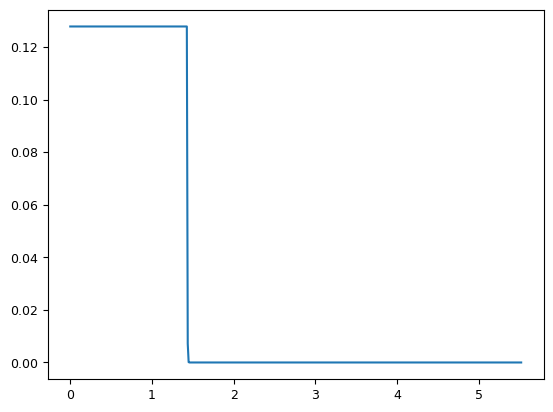

In [45]:
tk =np.arange(0,5,dx)
kernelNonMarked=SNH.optimalKernel((tk).reshape(1,-1))*fac
plt.plot(tk/fac,kernelNonMarked.reshape(-1))

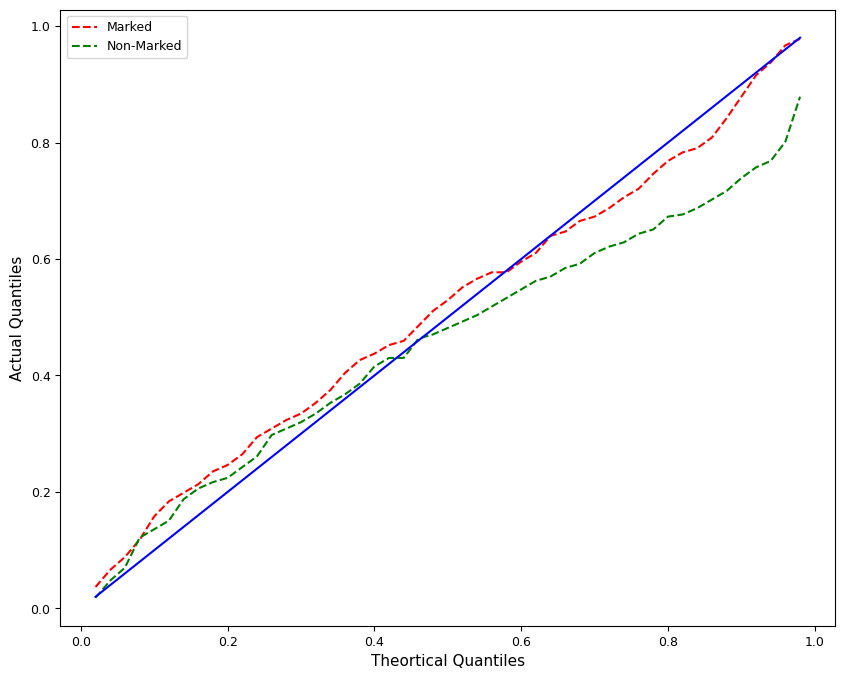

In [73]:
def qqplot(t_test,marks_test):
    optimalMu=markedSNH[0][5]/fac
    optimalMuNonMarked=sgdNonMarked[0][4]
    interArrP=[]
    interArrPNonMarked=[]
    for i in range(support,len(t_test),1):
      
        temp=t_test[0:i]
        markTemp=marks_test[0:i]
        uppLim=t_test[i]
        lowLim=t_test[i-1]
        intLambda_snh=0
        intLambda_snhNonMarked=0
        rangeInt=np.linspace(lowLim,uppLim,30)
        diff=rangeInt[1]-rangeInt[0]
        for j in range(len(rangeInt)):
            intLambda_snh+=diff*(optimalMu+(nnKernelOptimal(rangeInt[j]-temp,markTemp)).sum())
            intLambda_snhNonMarked+=diff*(optimalMuNonMarked+(SNH.optimalKernel((rangeInt[j]-temp).reshape(1,-1))).sum())
        interArrP.append(np.exp(-intLambda_snh))
        interArrPNonMarked.append(np.exp(-intLambda_snhNonMarked))
    interArrP=np.array(interArrP)
    interArrPNonMarked=np.array(interArrPNonMarked)
    probs=np.arange(0.02,1,0.02)
    qq=[]
    qqNonMarked=[]
    for k in (probs):
        qq.append(len(interArrP[interArrP<=k])/len(interArrP))
        qqNonMarked.append(len(interArrPNonMarked[interArrPNonMarked<=k])/len(interArrPNonMarked))
    plt.figure(figsize=(10,8))
    plt.rc('axes', titlesize=11)    
    plt.rc('axes', labelsize=11)   
    plt.rc('xtick', labelsize=9)    
    plt.rc('ytick', labelsize=9)    
    plt.rc('legend', fontsize=9 )   
    plt.rc('font', size=11)  

    plt.plot(probs,qq,'r--',label="Marked")
    plt.plot(probs,qqNonMarked,'g--',label="Non-Marked")
    plt.plot(probs,probs,'b-')
    plt.xlabel('Theortical Quantiles')
    plt.ylabel('Actual Quantiles')
    plt.legend()
    plt.savefig('results/SNHQQPlot.jpg',dpi=200, transparent=False, bbox_inches='tight')
    plt.pause(0.005)
    return
testLen=int(len(tscale)*0.85)-support
qqplot(tscale[testLen:],marks1[testLen:])


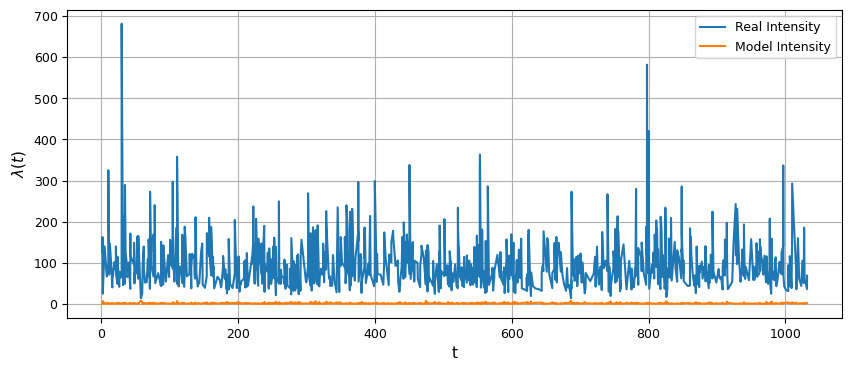

Coefficients: 
 [[-0.00428749]]


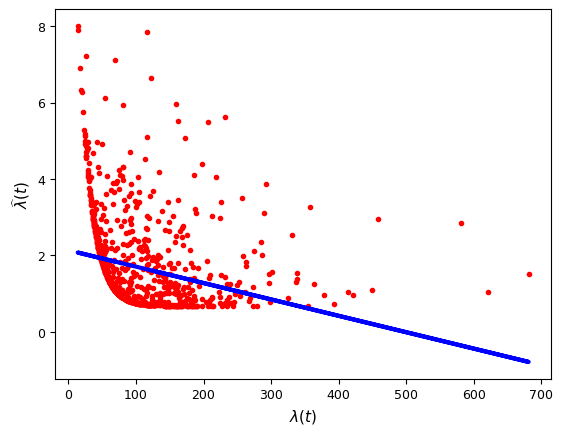

In [26]:

from sklearn import linear_model
%matplotlib inline
def plotlambdas(mu_t):
    dx=0.01
    optimalMu=markedSNH[0][5]
    tseries= tscale[0:1000]
    lambda_value=[]
    time_intervals=[]
    lambda_nn=[]
    lambdas_1=[]
    for i in range(1,len(tseries),1):
        new_temp=np.linspace(tseries[i-1],tseries[i],1)
      
        temp=new_temp.reshape(-1,1)-tseries[0:i]
        markTemp=marksO[0:i]
        mu_t=mu_t    
        lambdas=mu_t+np.sum(markedFactorMultplied(markTemp/facM,gamma)*np.exp(-theta*temp),axis=1)
        lambdas_snh=optimalMu+np.sum(nnKernelOptimal(temp,markTemp)*fac ,axis=1)

        time_intervals.append(new_temp)
        lambda_value.append(lambdas)
        lambda_nn.append(lambdas_snh)
    time_intervals=(np.array(time_intervals)).reshape(-1)
    lambda_value=(np.array(lambda_value)).reshape(-1)
    lambda_nn=np.array(lambda_nn).reshape(-1)
    plt.figure(figsize=(10,4))
    plt.plot(time_intervals,lambda_value,label='Real Intensity')
   
    plt.plot(time_intervals,lambda_nn,label='Model Intensity')
    

    plt.xlabel("t")
    plt.ylabel("$\lambda(t)$")
    plt.legend()
    plt.grid()
    plt.pause(0.0005)
    plt.plot(lambda_value,lambda_nn,'r.')
    # Create linear regression object
    regr = linear_model.LinearRegression()

# Train the model using the training sets
    regr.fit(lambda_value.reshape(-1,1), lambda_nn.reshape(-1,1))
    print("Coefficients: \n", regr.coef_)
    lambda_pred = regr.predict(lambda_value.reshape(-1,1))
    plt.plot(lambda_value, lambda_pred, color="blue", linewidth=3)
    plt.xlabel("$\lambda(t)$")
    plt.ylabel("$\widehat{\lambda}(t)$")
    #plt.plot(np.arange(0,12,0.1),np.arange(0,12,0.1))
    plt.pause(0.005)
plotlambdas(mu_t)


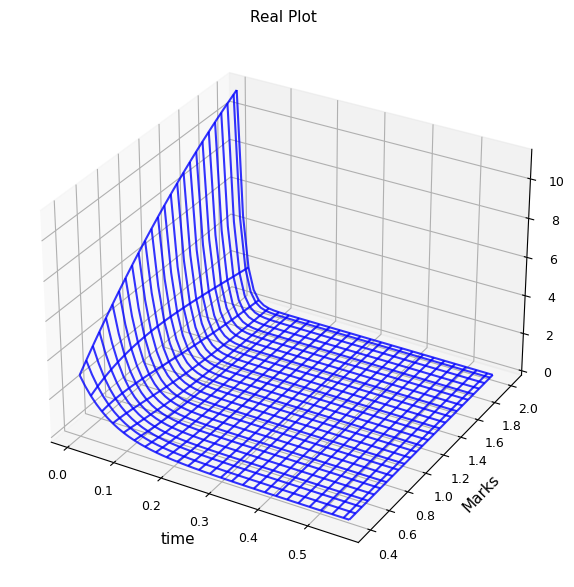

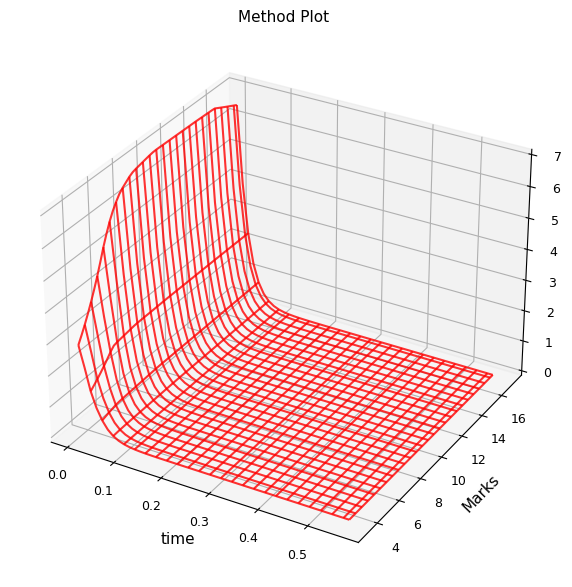

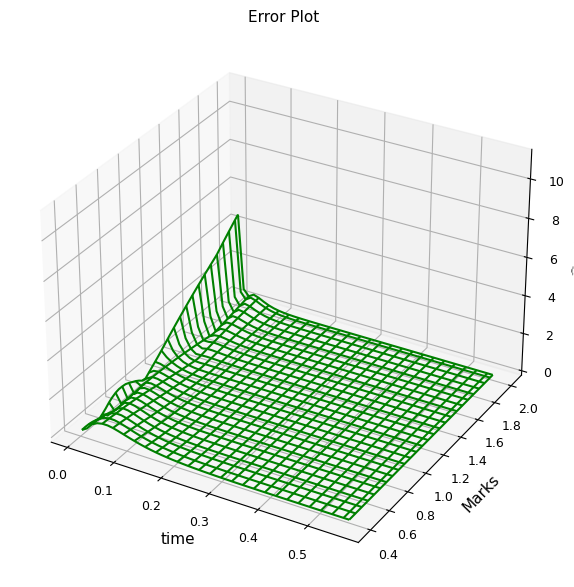

In [93]:
%matplotlib inline
def optimalValues():
    optimalAlphas=markedSNH[0][0]
    optimalAlpha0=markedSNH[0][1]
    optimalBetas1=markedSNH[0][2]
    optimalBetas2=markedSNH[0][3]
    optimalBeta0=markedSNH[0][4]
    optimalMu=markedSNH[0][5]/fac
    return optimalAlphas,optimalAlpha0,optimalBetas1,optimalBetas2,optimalBeta0,optimalMu

def nnKernelOptimal(x,mark):
    alphas,alpha0,betas1,betas2,beta0,mu=optimalValues()
    x=x.reshape(1,-1)
    markI=mark.reshape(1,-1)
    n1 = np.maximum(np.dot(betas1,x) + np.dot(betas2,markI)+ beta0,0.)
    y = np.dot(alphas.T,n1) + alpha0
    y = np.exp(y)
    return y    

def nnKernelMatrixOptimal(x,y):
    z=np.zeros((len(x),len(y)))
    for i in range(len(x)):
        z[i,:]=nnKernelOptimal(x[i,:],y[i,:]).reshape(-1)
            
    return z

dx=0.01
    
marksplot=np.sort(marks1)
lengthMarks=len(marksplot)
marksMin=marksplot[int(0.05*lengthMarks)]
marksMax=marksplot[int(0.95*lengthMarks)]
diff_t=np.diff(tscale)
diff_tSort=np.sort(diff_t)
length_difftSort=len(diff_tSort)
diffMin= diff_tSort[int(0.05*length_difftSort)]
diffMax= diff_tSort[int(0.95*length_difftSort)]
tk =np.arange(diffMin,0.5,dx)
marksP=np.linspace(marksMin,marksMax,len(tk))
    
    
X, Y = np.meshgrid(tk, marksP)
if kernelMarks=="combined":
    Z=function_kernelCombined(Y/facM,X,beta_0,beta_1) 
else:
    if(kernelType == 0):
        #y = alpha*np.exp(-beta*tk)
        Z=markedFactorMultplied(Y/facM,gamma)*function_kernel1(theta,X)         
    
fig = plt.figure(figsize=(12,6))
 
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_wireframe(X/fac, Y, Z, cmap="Blues",
                       rstride=2, cstride=2, alpha=0.8,color="blue",label="real")

ax.set_xlabel('time')
ax.set_ylabel('Marks')
ax.set_zlabel('$\phi$')
ax.set_title('Real Plot')
plt.grid()
fig.tight_layout()
plt.savefig("results/1d_real.jpg",dpi=100)
plt.pause(0.0005)

fig = plt.figure(figsize=(12,6))
Z2=nnKernelMatrixOptimal(X/fac,Y)*fac  
ax = fig.add_subplot(111, projection='3d')
surf1 = ax.plot_wireframe(X/fac, Y/facM, Z2, cmap="Reds",
                       rstride=2, cstride=2,alpha=0.8,color="red" ,label="Method")


ax.set_xlabel('time')
ax.set_ylabel('Marks')
ax.set_zlabel('$\phi$')
    
ax.set_title('Method Plot')
plt.grid()
fig.tight_layout()
plt.savefig("results/1d_method.jpg",dpi=100)
plt.pause(0.0005)
X, Y = np.meshgrid(tk, marksP)
fig = plt.figure(figsize=(12,6))
 
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_wireframe(X/fac, Y, np.abs(Z2-Z), cmap="Greens",
                       rstride=2, cstride=2, color="green",label="error")


ax.set_xlabel('time')
ax.set_ylabel('Marks')
ax.set_zlabel('$\widehat{\phi}-\phi$')
ax.set_zlim(0, max(Z.reshape(-1)))
ax.set_title('Error Plot')
plt.grid()
fig.tight_layout()
plt.savefig("results/1d_error.jpg",dpi=100)
plt.pause(0.0005)

    

# Non Marked

In [ ]:
def plotlambdasNonMark(mu_t):
    dx=0.01
    optimalMu=sgdNonMarked[0][4]*fac
    tseries= tscale[0:1000]
    lambda_value=[]
    time_intervals=[]
    lambda_nn=[]
    lambdas_1=[]
    for i in range(1,len(tseries),1):
        new_temp=np.linspace(tseries[i-1],tseries[i],1)
      
        temp=new_temp.reshape(-1,1)-tseries[0:i]
        markTemp=marksO[0:i]
        mu_t=mu_t    
        lambdas=mu_t+np.sum(markedFactorMultplied(markTemp,gamma)*np.exp(-theta*temp),axis=1)
        lambdas_snh=optimalMu+np.sum(SNH.optimalKernel(temp)*fac,axis=1)

        time_intervals.append(new_temp)
        lambda_value.append(lambdas)
        lambda_nn.append(lambdas_snh)
    time_intervals=(np.array(time_intervals)).reshape(-1)
    lambda_value=(np.array(lambda_value)).reshape(-1)
    lambda_nn=np.array(lambda_nn).reshape(-1)
    plt.figure(figsize=(10,4))
    plt.plot(time_intervals,lambda_value,label='Real Intensity')
   
    plt.plot(time_intervals,lambda_nn,label='Model Intensity')
    

    plt.xlabel("t")
    plt.ylabel("$\lambda(t)$")
    plt.legend()
    plt.grid()
    plt.pause(0.0005)
    plt.plot(lambda_value,lambda_nn,'r.')
    # Create linear regression object
    regr = linear_model.LinearRegression()

# Train the model using the training sets
    regr.fit(lambda_value.reshape(-1,1), lambda_nn.reshape(-1,1))
    print("Coefficients: \n", regr.coef_)
    lambda_pred = regr.predict(lambda_value.reshape(-1,1))
    plt.plot(lambda_value, lambda_pred, color="blue", linewidth=3)
    plt.xlabel("$\lambda(t)$")
    plt.ylabel("$\widehat{\lambda}(t)$")
    #plt.plot(np.arange(0,12,0.1),np.arange(0,12,0.1))
    plt.pause(0.005)


plotlambdasNonMark(mu_t)

In [ ]:
import time
dx=0.1
timestr= time.strftime("%Y%m%d-%H%M%S")
marksplot=np.sort(marksO)
lengthMarks=len(marksplot)
marksMin=marksplot[int(0.05*lengthMarks)]
marksMax=marksplot[int(0.95*lengthMarks)]
diff_t=np.diff(tscale)
diff_tSort=np.sort(diff_t)
length_difftSort=len(diff_tSort)
diffMin= diff_tSort[int(0.05*length_difftSort)]
diffMax= diff_tSort[int(0.95*length_difftSort)]
tk =np.arange(diffMin,diffMax,dx)
marksP=np.linspace(marksMin,marksMax,len(tk))
marks2=np.arange(marksMin,marksMax,dx)

dp=1
fig = plt.figure(figsize=(8,6))
X1=np.linspace(marksMin,marksMax,4)
R=np.linspace(0.0,1,len(X1))
G=np.linspace(0,0.5,len(X1))
B1=np.linspace(0,0.5,len(X1))
for j in range(len(X1)):

    plt.plot(tk/fac,nnKernel(tk/fac,np.ones(len(tk)).reshape(-1)*X1[j]*facM).reshape(-1)*fac,label='Marks=%.2f'%X1[j],color=(R[j],G[j],B1[j]))
    plt.plot(tk/fac,markedFactorMultplied1(X1[j],gamma)*function_kernel1(theta,tk),"--",color=(R[j],G[j],B1[j]))
    plt.xlabel('t')
    plt.ylabel('$\phi$')


plt.legend()
plt.savefig("results/"+timestr+"phi-tplotsSNH.jpg")
plt.pause(0.005)

fig = plt.figure(figsize=(8,6))
X2=np.linspace(diffMin,diffMax,len(X1))
for j in range(len(X2)):
    plt.plot(marksP,nnKernel(np.ones(len(marksP)).reshape(-1)*X2[j]/fac,marksP*facM).reshape(-1)*fac,label='t=%.2f'%X2[j],color=(R[j],G[j],B1[j]))
    plt.plot(marksP,markedFactorMultplied1(marksP,gamma)*function_kernel1(theta,X2[j]),"--",color=(R[j],G[j],B1[j]))
    plt.xlabel('Marks')
    plt.ylabel('$\phi$')

plt.legend()
plt.savefig("results/"+timestr+"phi-MarksplotsSNH.jpg")
plt.pause(0.005)

In [ ]:
X1=np.linspace(marksMin,marksMax,10)
R=np.linspace(0.0,1,len(X1))
G=np.linspace(0,0.5,len(X1))
B1=np.linspace(0,0.5,len(X1))
X2=np.linspace(0,0.5,10)
for j in range(len(X2)):
    plt.plot(marksP,nnKernel(np.ones(len(marksP)).reshape(-1)*X2[j]/fac,marksP*facM).reshape(-1)*fac,label='t=%.2f'%X2[j],color=(R[j],G[j],B1[j]))
    plt.plot(marksP,markedFactorMultplied1(marksP,gamma)*function_kernel1(theta,X2[j]),"--",color=(R[j],G[j],B1[j]))
    plt.xlabel('Marks')
    plt.ylabel('$\phi$')
plt.legend()

In [ ]:


def loglikelihood(para,marks,t):
    theta=para[0]
    beta =para[1]
    mu=para[2]
    tend = t[-1]-t
    ll=mu*(t[-1]-t[0])
    ll+=((1-np.exp(-theta*tend))/theta*marks).sum()
    #print('exp',ll)
    for i in range(0,len(t),1):
        temp = t[i]-t[0:i]
        markTemp=marks[0:i]
        logLam = -np.log(mu+(markTemp*np.exp(-theta*temp)).sum())
        ll = ll+logLam
    ll-=(np.log(beta*np.exp(-beta*marks))).sum()
    return ll


def gradientll(para,t,marks,iArray):
   
    theta =para[0]
    beta=para[1]
    mu=para[2]
    tend = t[-1]-t

    grad = np.array([0.0, 0.0, 0.0])
    for i  in np.nditer(iArray):
        if i>0:
            temp = t[i]-t[0:i]
            markTemp=marks[0:i]
            decayFactor = np.exp(-theta*temp)*markTemp
            lam = mu+sum(decayFactor)
            
            fac1 = np.exp(-theta*tend[i])
            fac2= (marks[i]/theta**2)*(-fac1*tend[i]*theta-(1-fac1))
            fac3=1/(beta*np.exp(-beta*marks[i]))
            
            grad[0]=grad[0]+(1/lam)*((temp*decayFactor).sum())+fac2
            grad[1]= grad[1]-fac3*np.exp(-beta*marks[i])*(-beta*marks[i]+1)
            grad[2]=grad[2]+t[i]-t[i-1]-1/lam
            
        
    return grad/len(iArray)

def sgdHawkes(para,t,marks,lr):
    global bestpara,bestll

    theta =para[0]
    beta=para[1]
    mu=para[2]
    lr =lr
    beta_1 = 0.9
    beta_2 =0.999
    epsilon = 1e-8
    count = 0
    bestll = 1e8
    bestpara = np.array([0.,0.,0.])
    m_t = np.array([0.,0.,0.])
    v_t = np.array([0.,0.,0.])
    print(loglikelihood(para,marks,t))
    for epochs in range(1,100+1,1):
        
        rsample = np.random.choice(len(t),max(len(t),len(t)))
        for i in range(1,len(rsample),20):
            count=count+1 
            grad = gradientll(para,t,marks,rsample[i:i+20])
            
            m_t = beta_1*m_t + (1-beta_1)*grad	#updates the moving averages of the gradient
            v_t = beta_2*v_t + (1-beta_2)*(grad*grad)	#updates the moving averages of the squared gradient
            m_cap = m_t/(1-(beta_1**count))		#calculates the bias-corrected estimates
            v_cap = v_t/(1-(beta_2**count))		#calculates the bias-corrected estimates
            para = para-(lr*m_cap)/(np.sqrt(v_cap)+epsilon)
            
        error=loglikelihood(para,marks,t)
        bestpara = para*(bestll>=error)+bestpara*(bestll<error)
        para = np.maximum(para,0.01)
        bestll = min(bestll,error)
            
        print(epochs,error,bestll,para,bestpara)   #iteration, -loglikelihood, bestloglik, currentpara, bestpara 
    return bestpara
    
para=np.random.uniform(0,1,3)
lr=0.005
#print("orginal LL",loglikelihood([theta,beta,mu],marks))
sgdHawkes(para,tscale,marks1,lr)

In [ ]:
NNNHNew=MHN.sgdNeuralHawkes(80,0.05,0.1,1e-3,tscale,marks1,fac)

In [ ]:
import datetime  

%matplotlib inline
dx=0.01
tk = np.arange(0,5,dx)

marks1=np.arange(0,2,dx)
X, Y = np.meshgrid(tk, marks1)
dp=1
fig = plt.figure(figsize=(8,6))
X1=np.arange(0.0,2,0.2)

for j in range(len(X1)):
    plt.plot(tk/fac,nnKernel(tk,np.ones(len(tk))*X1[j]).reshape(-1)*fac,label='Marks=%.2f'%X1[j])
    plt.xlabel('t')
    plt.ylabel('$\phi$')
    plt.xlim(-0.1,500)
    #plt.ylim(0,5)
plt.legend()
plt.savefig("1BTC_USD_tphi_%i.jpg"%initial,dpi=100)
plt.pause(0.005)

fig = plt.figure(figsize=(8,6))
X2=np.arange(0.0,100.0,5)
for j in range(len(X2)):
    plt.plot(marks1,nnKernel(np.ones(len(marks1))*X2[j]*fac,marks1).reshape(-1)*fac,label='t=%.2f'%X2[j])
    plt.xlabel('Marks')
    plt.ylabel('$\phi$')
    #plt.xlim(0,5)
    #plt.ylim(0,20)
plt.legend()
plt.savefig("1BTC_USD_markphi_%i.jpg"%initial,dpi=100)
plt.pause(0.005)
np.save("SNHmarked_%i.npy"%initial,{'Results':markedSNH,'Timestamps':sell_t,'marks':marks,'factor':fac,'mu':mu*fac})

In [ ]:
%matplotlib notebook

def plotKernels():
    dx=0.01
    tk = np.arange(0,5,dx)
    interestX = Dict.get('inflection')
    marks1=np.arange(0,5,dx)
    X, Y = np.meshgrid(tk, marks1)
    if(kernelType == 0):
        #y = alpha*np.exp(-beta*tk)
        Z=Y*function_kernel1(theta,X)
        Z2=nnKernelMatrix(X,Y)*fac
            
    
    fig = plt.figure(figsize=(8,6))
 
  
    ax = plt.axes(projection ='3d')
    #ax.plot3D(X,marks1,kernel_value,'r-')
    #surf = ax.plot_surface(X, Y, Z, cmap="Blues",
     #                  linewidth=0, antialiased=False,label="real")
    surf1 = ax.plot_wireframe(X/fac, Y, Z2,color="black")
    #fig.colorbar(surf, label='Real Value')
    #fig.colorbar(surf1, label='New Method')
    ax.set_xlabel('time')
    ax.set_ylabel('Marks')
    ax.set_zlabel('$\phi$')
    
    plt.grid()
    plt.savefig("1BTC_USD_3d_%i.jpg"%initial,dpi=100)
    plt.pause(0.0005)   
    return 0
plotKernels()

In [ ]:
np.load("20230501-151746_NNNH.npy",allow_pickle=True)

In [ ]:

import numpy as np
 

url= "combinedCsv1.csv"
dataset = pd.read_csv(url,names=['Timestamp', 'Price','Volume','Buyer ID','Seller ID','Buyer is market maker'])

dataset = dataset.sort_values(dataset.columns[0])
dataset=dataset.reset_index(drop=True)

initial=dataset["Timestamp"][0]+3600*4*1e3
final=dataset["Timestamp"][0]+3600*5*1e3
dataset=dataset.loc[dataset.loc[:,"Timestamp"]>initial]
dataset=dataset.loc[dataset.loc[:,"Timestamp"]<final]

buy_df = dataset.loc[dataset.iloc[:,5]=="f"]
sell_df = dataset.loc[dataset.iloc[:,5]=="t"]
buy = buy_df.drop_duplicates(['Buyer ID'])

IdenticalSells=sell_df.sort_values("Seller ID")

ids=IdenticalSells["Seller ID"]
IdenticalSells=IdenticalSells.reset_index(drop=True)
for j in range(1,len(ids)):

    if IdenticalSells.loc[j-1,"Seller ID"]==IdenticalSells.loc[j,"Seller ID"]:
        IdenticalSells.loc[j,"Volume"]+=IdenticalSells.loc[j-1,"Volume"]
        IdenticalSells=IdenticalSells.drop([j-1])

IdenticalSells=IdenticalSells.sort_values("Volume")
IdenticalSells=IdenticalSells.reset_index(drop=True)
IdenticalSells=IdenticalSells[0:int(len(IdenticalSells)*0.95)]

sell=IdenticalSells
sell=sell.sort_values("Timestamp")
sell=sell.reset_index(drop=True)
#ms to seconds
utc_sell = (sell.iloc[:,0].values)
utc_buy = (buy.iloc[:,0].values)
utc_sell_v=(sell.iloc[:,2].values)
#convert utc to seconds since t0
t_sell = utc_sell-utc_sell[0]
    
t_buy = utc_buy-utc_buy[0]
    
#timestamp = list([np.array(t_buy),np.array(t_sell)])
t_sell=np.sort(np.array(t_sell)).reshape(-1,1)
t_buy=np.sort(np.array(t_buy)).reshape(-1,1)
t=[t_sell,t_buy]

print('N =',len(t_sell)+len(t_buy))

print("N of sell- ",len(t_sell) ,"N of buy-",len(t_buy))
totalD=len(t)
for j in range(totalD):
    if t[j][0]!=0:
        t[j]=np.insert(t[j],0,0)
    else:
        t[j]=np.array(t[j])
fac=0
tmax=0
for j in range(totalD):
    t[j]=np.sort(t[j])

for p in range(totalD):
    tmax=max(tmax,t[p][-1])

for p in range(len(t)):
    fac+=len(t[p])
fac=len(t[0])/t[0][-1]
sell_t=t[0].reshape(-1)*fac
utc_sell_v=np.array(utc_sell_v)
len(utc_sell_v)


In [ ]:
from statsmodels.tsa.stattools import adfuller
result=adfuller(np.diff(t1))
result

In [ ]:
plt.plot(np.arange(0,5,0.1),function_kernelCombined(np.arange(0,5,0.1),0.3,beta_0,beta_1))

In [ ]:
from joblib import Parallel, delayed